# **Beginning**
Mengimport semua packages dan dataset yang diperlukan untuk implementasi Machine Learning


In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import balanced_accuracy_score, f1_score,confusion_matrix
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns
import shap
import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

df = pd.read_csv('/kaggle/input/depression-dataset/depression_data.csv')

df.head()

/kaggle/input/depression-dataset/depression_data.csv


,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes
1,Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes
2,Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No
3,Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No
4,Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes


In [2]:
#Ringkasan dataset kita
df.describe()

,Age,Number of Children,Income
count,413768.000000,413768.000000,413768.000000
mean,49.000713,1.298972,50661.707971
std,18.158759,1.237054,40624.100565
min,18.000000,0.000000,0.410000
25%,33.000000,0.000000,21001.030000
50%,49.000000,1.000000,37520.135000
75%,65.000000,2.000000,76616.300000
max,80.000000,4.000000,209995.220000


In [3]:
#Ringkasan dataset kita untuk setiap fitur (ciri-ciri orang)
df.describe(include='object')

,Name,Marital Status,Education Level,Smoking Status,Physical Activity Level,Employment Status,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
count,413768,413768,413768,413768,413768,413768,413768,413768,413768,413768,413768,413768,413768
unique,196851,4,5,3,3,2,3,3,3,2,2,2,2
top,Michael Smith,Married,Bachelor's Degree,Non-smoker,Sedentary,Employed,Moderate,Unhealthy,Fair,No,No,No,No
freq,198,240444,124329,247416,176850,265659,173440,170817,196789,287943,284880,302515,277561


# **Pre-Processing** # 

Kita akan bagi menjadi 2 case, yaitu Data Pre-Processing untuk EDA: menghapus missing values dan duplicates (pada kasus ini tidak ada data kosong dan duplikat sehingga tidak dilakukan pada coding ini), menghapus kolom yang tidak penting; dan Data Pre-Procesing untuk prediksi, proses dari jenis data Pre-Processing sebelumnya tetapi ditambah langkah label encoder dan normalisasi melalui MinMaxScaler.

Hasil dari Data EDA adalah df1 dan Data untuk prediksi adalah df2. Kedua dataframe juga akan dihilangkkan outliersnya.

In [4]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
def edu_encoder(data):
    education_mapping = {
        "High School": 1,
        "Associate Degree": 2,
        "Bachelor's Degree": 3,
        "Master's Degree": 4,
        "PhD": 5}
    return education_mapping.get(data, 0)

def income_encoder(data):
    income_mapping = {
        'Low':1,
        'Medium':2,
        'High':3,
        'Very High':4}
    return income_mapping.get(data, 0)

def age_encoder(data):
    age_mapping = {
        'Under 18':1,
        '18-35':2,
        '36-50':3,
        '51-65':4,
        '65+':5}
    return age_mapping.get(data, 0)


def physics_encoder(data):
    physics_mapping = {
        "Sedentary": 1,
        "Moderate": 2,
        "Active": 3}
    return physics_mapping.get(data, 0)

def alcohol_encoder(data):
    alcohol_mapping = {
        "Low": 1,
        "Moderate": 2,
        "High": 3}
    return alcohol_mapping.get(data, 0)

def diet_encoder(data):
    diet_mapping = {
        "Unhealthy": 1,
        "Moderate": 2,
        "Healthy": 3}
    return diet_mapping.get(data, 0)

def sleep_encoder(data):
    sleep_mapping = {
        "Poor": 1,
        "Fair": 2,
        "Good": 3}
    return sleep_mapping.get(data, 0)

def cleaning_for_EDA(df):
  df2 = df.copy()
  df2.drop(columns=["Name"], inplace = True)
  df2.dropna(inplace=True)
  df2['Age_bin'] = pd.cut(df['Age'], bins=[-np.inf, 18, 35, 50, 65, np.inf], labels=['Under 18', '18-35', '36-50', '51-65', '65+'])
  df2['Income_bin'] = pd.qcut(df2['Income'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])
  return df2

def wrangling_to_predict(df):
  df2 = df.copy()
  df2= pd.concat([df2,pd.get_dummies(df2["Marital Status"],dtype=int)],axis=1)
  df2.drop(columns=["Single"],inplace=True)
  df2= pd.concat([df2,pd.get_dummies(df2["Smoking Status"],dtype=int)],axis=1)
  df2.drop(columns=["Non-smoker"],inplace=True)
  df2["Education_Level"] = df2["Education Level"].apply(edu_encoder)
  df2["Physics_Activity"] = df2["Physical Activity Level"].apply(physics_encoder)
  df2["Alcohol_Consumption"] = df2["Alcohol Consumption"].apply(alcohol_encoder)
  df2["Diet_Habits"] = df2["Dietary Habits"].apply(diet_encoder)
  df2["Sleep_Patterns"] = df2["Sleep Patterns"].apply(sleep_encoder)
  df2['Income_bin'] = df2['Income_bin'].apply(income_encoder)
  df2['Age_bin'] = df2['Age_bin'].apply(age_encoder)
  df2[['Income_bin','Age_bin']] = df2[['Income_bin','Age_bin']].astype('int64')
  le = LabelEncoder()
  df2["Employment_Status"] = le.fit_transform(df2["Employment Status"])
  df2["Mental_Illness"] = le.fit_transform(df2["History of Mental Illness"])
  df2["Substance_Abuse"] = le.fit_transform(df2["History of Substance Abuse"])
  df2["FamHist_Depression"] = le.fit_transform(df2["Family History of Depression"])
  df2["ChronicMedCondition"] = le.fit_transform(df2["Chronic Medical Conditions"])

  return df2


In [5]:
#df1 : Untuk Exploratory Data Analysis
#df2 : Untuk bisa dipakai ke Feature Selections dan Modelling

df1= cleaning_for_EDA(df)
df2 = wrangling_to_predict(df1)

In [6]:
df2.dtypes

Age                               int64
Marital Status                   object
Education Level                  object
Number of Children                int64
Smoking Status                   object
Physical Activity Level          object
Employment Status                object
Income                          float64
Alcohol Consumption              object
Dietary Habits                   object
Sleep Patterns                   object
History of Mental Illness        object
History of Substance Abuse       object
Family History of Depression     object
Chronic Medical Conditions       object
Age_bin                           int64
Income_bin                        int64
Divorced                          int64
Married                           int64
Widowed                           int64
Current                           int64
Former                            int64
Education_Level                   int64
Physics_Activity                  int64
Alcohol_Consumption               int64


In [7]:
df2 = df2.select_dtypes(exclude=['object'])

In [8]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df2[['Age','Income','Number of Children']] = scaler.fit_transform(df2[['Age','Income','Number of Children']])

from scipy import stats
import numpy as np
z_scores1 = np.abs(stats.zscore(df1["Income"]))
z_scores2 = np.abs(stats.zscore(df2["Income"]))
df1 = df1[z_scores1 < 2]
df2 = df2[z_scores2 < 2]

from sklearn.preprocessing import MinMaxScaler

ordinal_columns2 = ['Education_Level', 'Physics_Activity', 'Alcohol_Consumption',
                   'Diet_Habits', 'Sleep_Patterns','Income_bin','Age_bin']

scaler = MinMaxScaler()
df2[ordinal_columns2] = scaler.fit_transform(df2[ordinal_columns2])


In [9]:
df2.describe()

,Age,Number of Children,Income,Age_bin,Income_bin,Divorced,Married,Widowed,Current,Former,Education_Level,Physics_Activity,Alcohol_Consumption,Diet_Habits,Sleep_Patterns,Employment_Status,Mental_Illness,Substance_Abuse,FamHist_Depression,ChronicMedCondition
count,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000,391283.000000
mean,-0.004992,-0.007633,-0.145550,0.602106,0.471267,0.077995,0.577820,0.165463,0.121858,0.279925,0.345837,0.383057,0.452289,0.373784,0.446329,0.378521,0.309382,0.311562,0.268496,0.329971
std,1.006653,0.998559,0.808952,0.291782,0.362876,0.268164,0.493908,0.371599,0.327122,0.448963,0.282765,0.375565,0.378487,0.361644,0.358110,0.485019,0.462240,0.463133,0.443178,0.470203
min,-1.707206,-1.050054,-1.247076,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.881158,-1.050054,-0.757707,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-0.000039,-0.241681,-0.378398,0.500000,0.333333,0.000000,1.000000,0.000000,0.000000,0.000000,0.250000,0.500000,0.500000,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.881079,0.566692,0.368334,0.750000,0.666667,0.000000,1.000000,0.000000,0.000000,1.000000,0.500000,0.500000,0.500000,0.500000,0.500000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.707128,2.183439,1.999965,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
df1.describe(include='all')

,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions,Age_bin,Income_bin
count,391283.000000,391283,391283,391283.00000,391283,391283,391283,391283.000000,391283,391283,391283,391283,391283,391283,391283,391283,391283
unique,NaN,4,5,NaN,3,3,2,NaN,3,3,3,2,2,2,2,5,4
top,NaN,Married,Bachelor's Degree,NaN,Non-smoker,Sedentary,Employed,NaN,Moderate,Unhealthy,Fair,No,No,No,No,18-35,Low
freq,NaN,226091,124329,NaN,234072,166840,243174,NaN,163512,164201,186058,270227,269374,286225,262171,106711,103443
mean,48.910057,NaN,NaN,1.28953,NaN,NaN,NaN,44748.870216,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,18.279548,NaN,NaN,1.23527,NaN,NaN,NaN,32862.908929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,18.000000,NaN,NaN,0.00000,NaN,NaN,NaN,0.410000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,33.000000,NaN,NaN,0.00000,NaN,NaN,NaN,19880.600000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,49.000000,NaN,NaN,1.00000,NaN,NaN,NaN,35289.650000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,65.000000,NaN,NaN,2.00000,NaN,NaN,NaN,65624.940000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# **Data Visualization** # 

Untuk satu fitur, kita akan melihat distribusi dari setiap fitur, sedangkan untuk dua fitur, kita akan fokus perbedaan distribusi dari setiap fitur berdasarkan status depresi.

In [11]:
#One Feature
df1_num = df1.select_dtypes(include=["float", "int"]).columns
df1_cat = df1.drop(columns=df1_num).columns

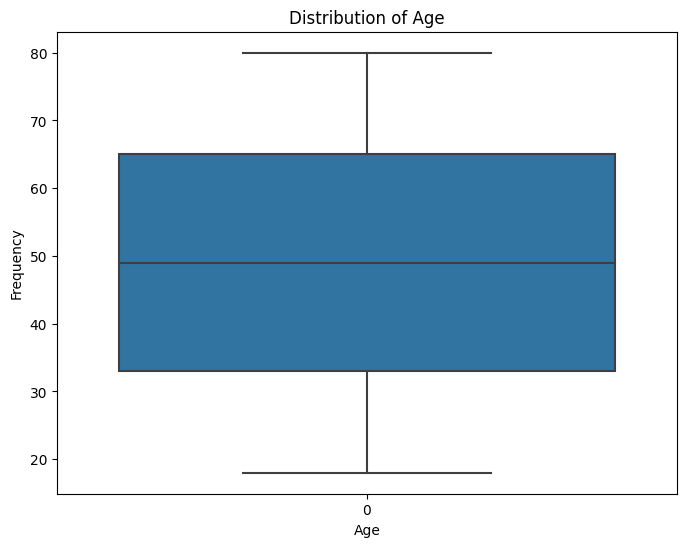

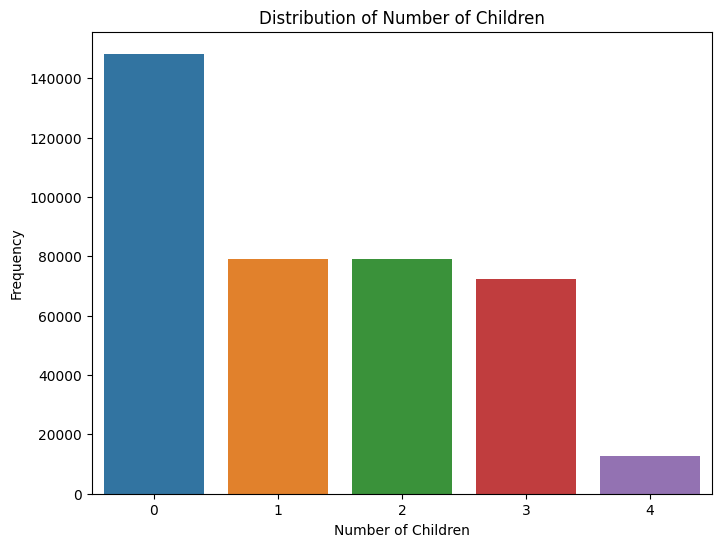

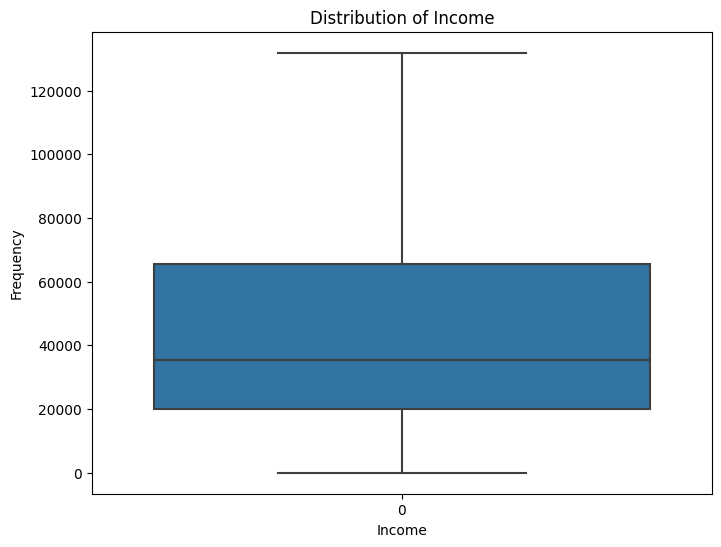

In [12]:
for feature in df1_num:
    plt.figure(figsize=(8, 6))
    if feature == "Number of Children":
        sns.countplot(df1,x=feature)
    else:
        sns.boxplot(df1[feature])  # Using seaborn histplot
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(False)  # Disable gridlines
    plt.show()

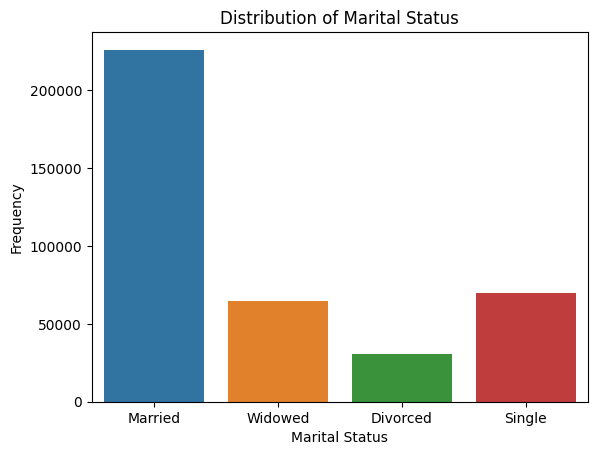

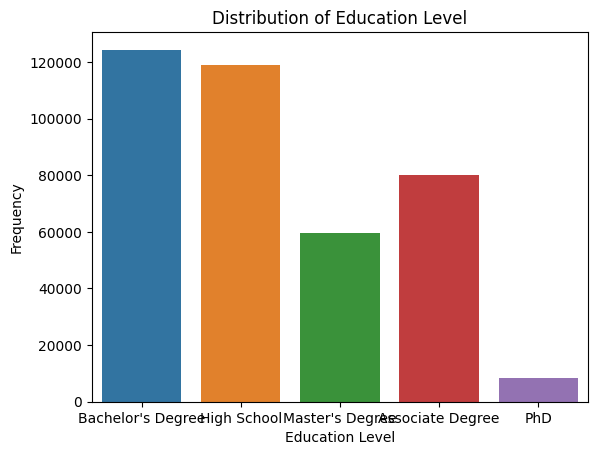

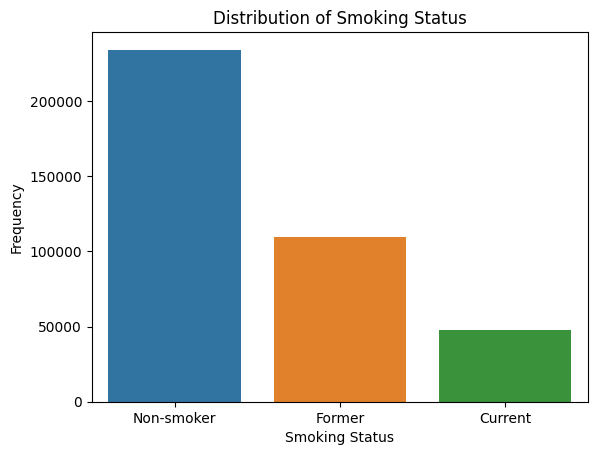

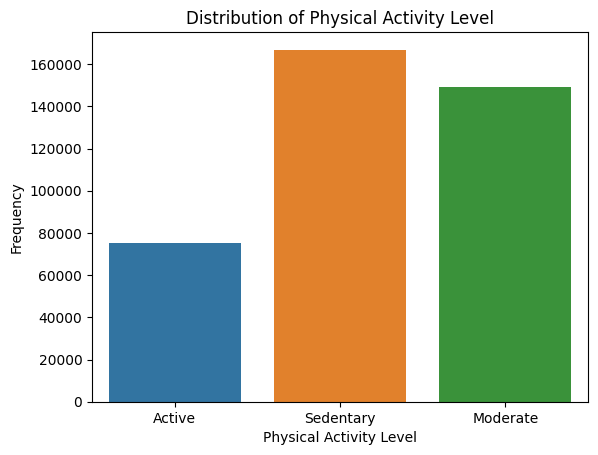

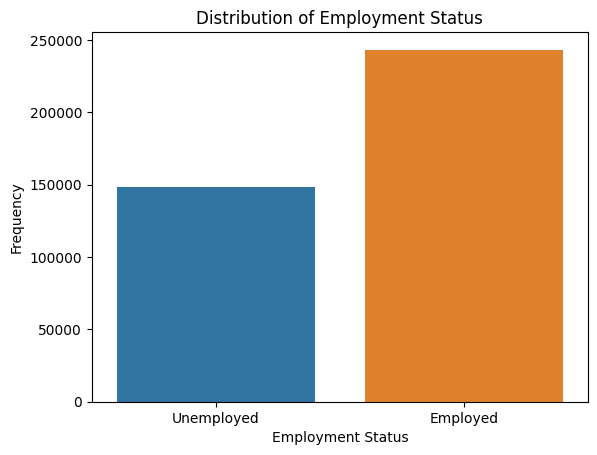

...

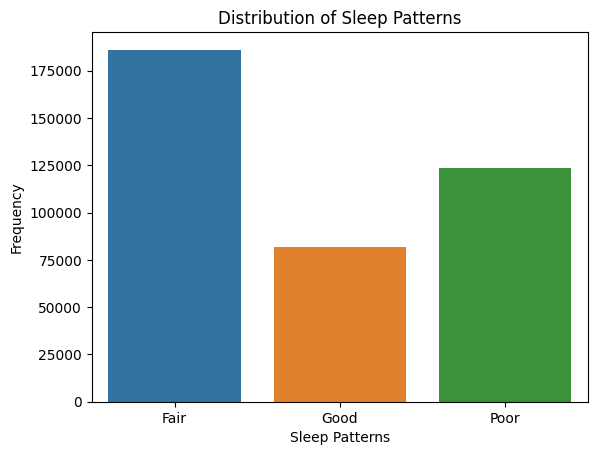

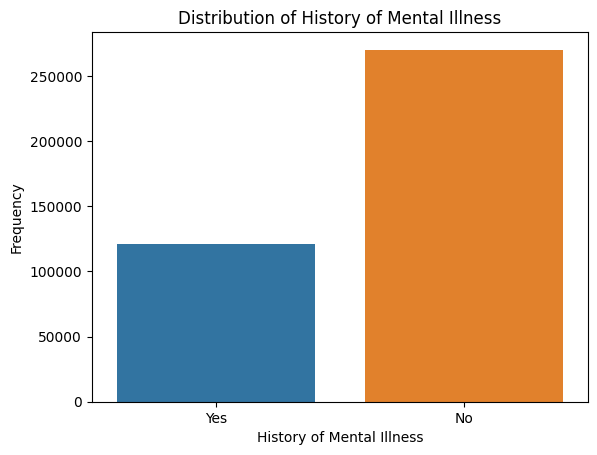

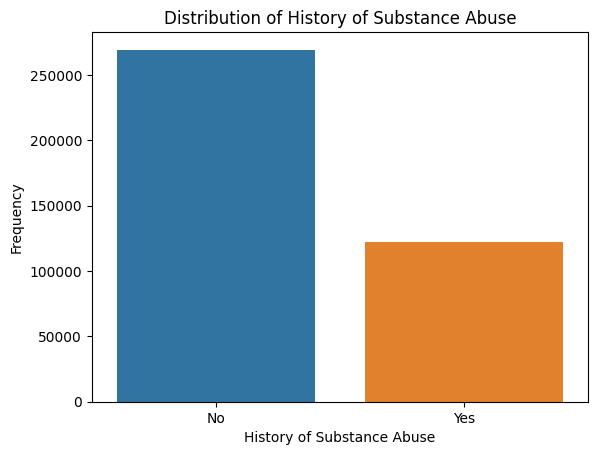

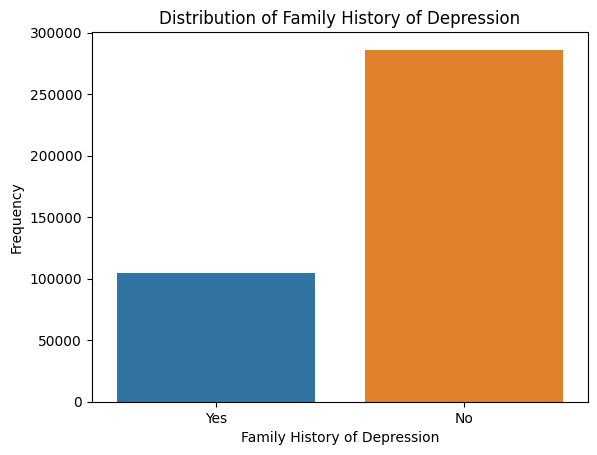

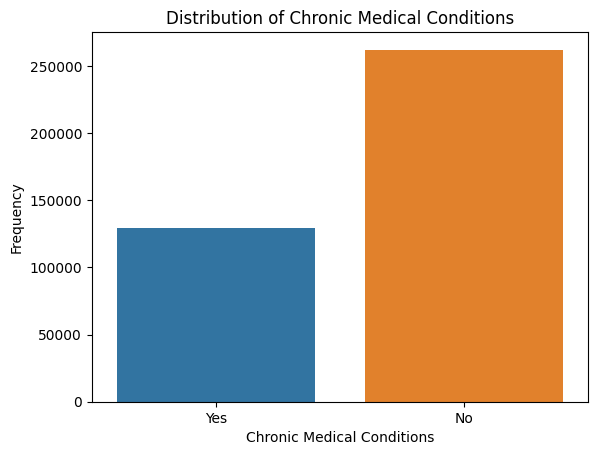

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


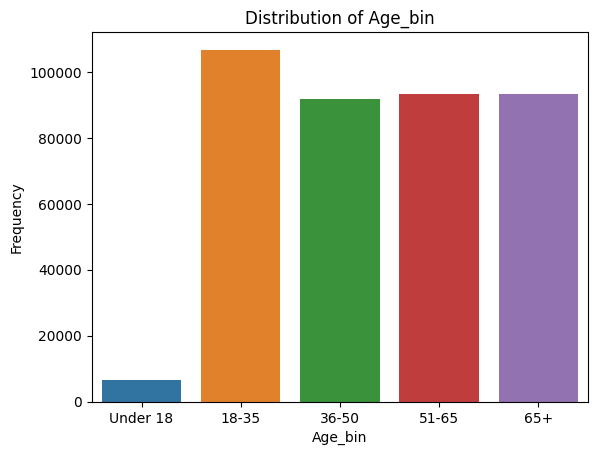

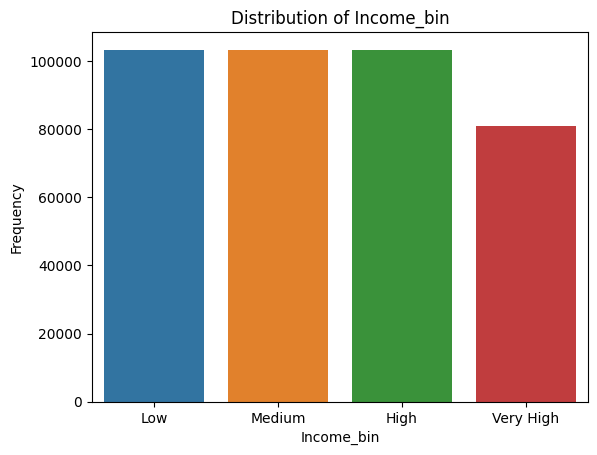

In [13]:
for feature in df1_cat:
    sns.countplot(df1,x=feature)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(False)  # Disable gridlines
    plt.show()

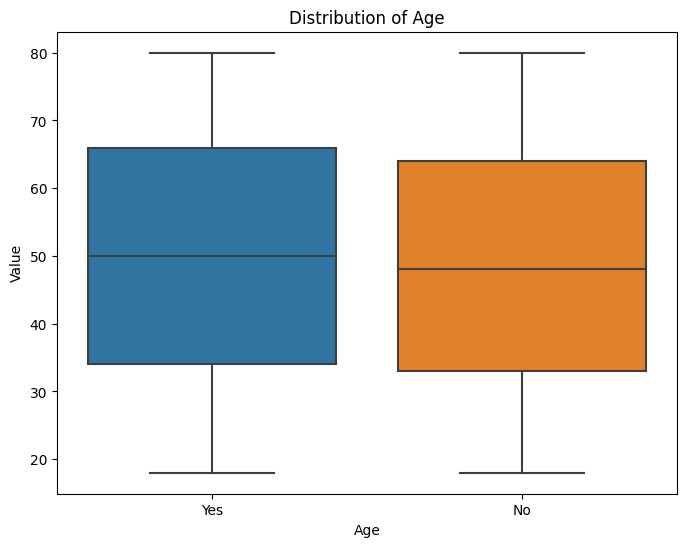

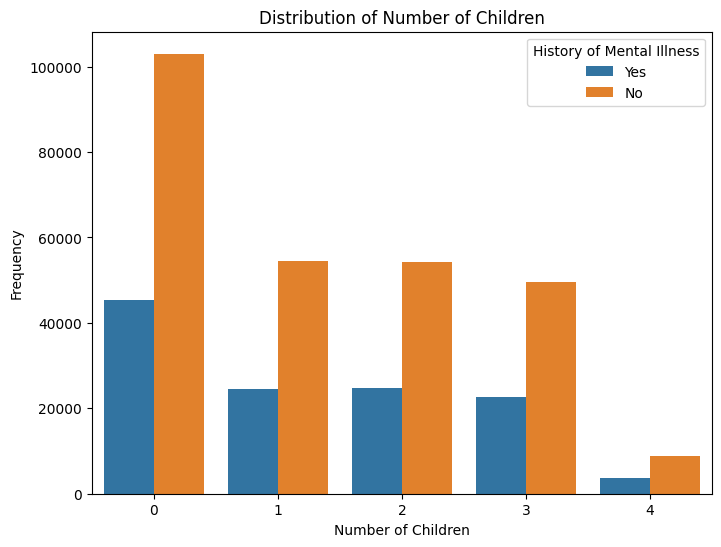

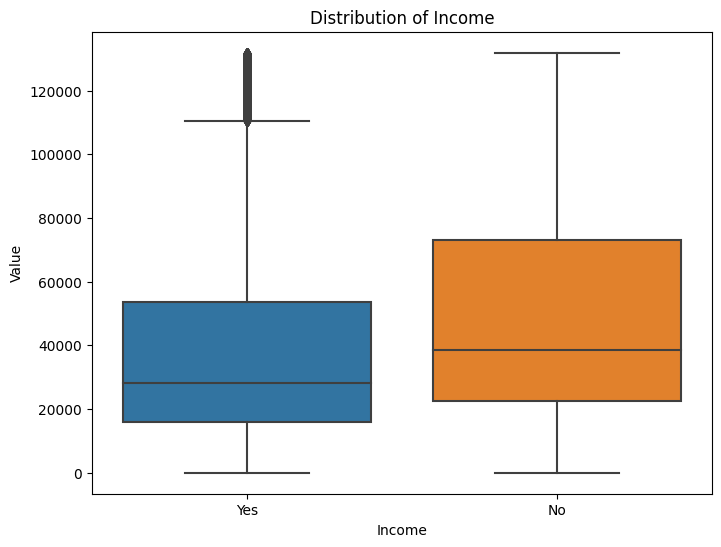

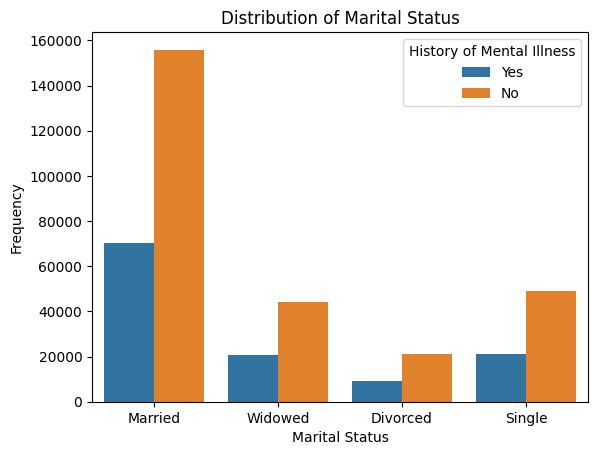

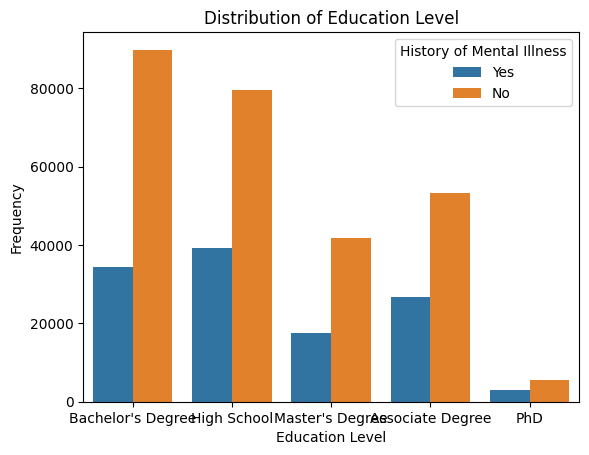

...

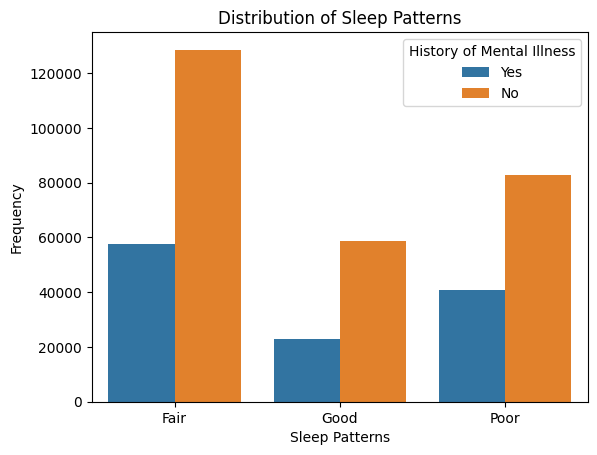

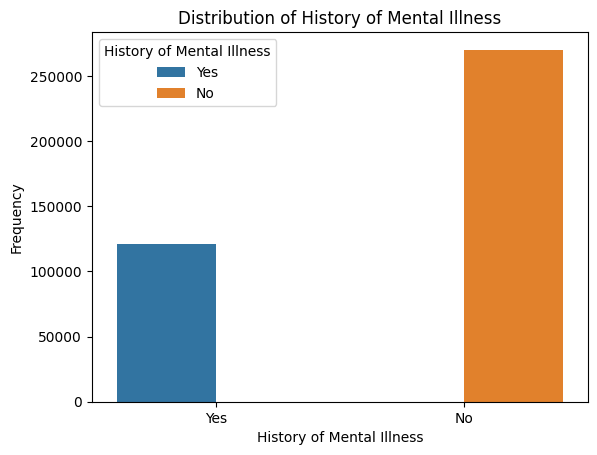

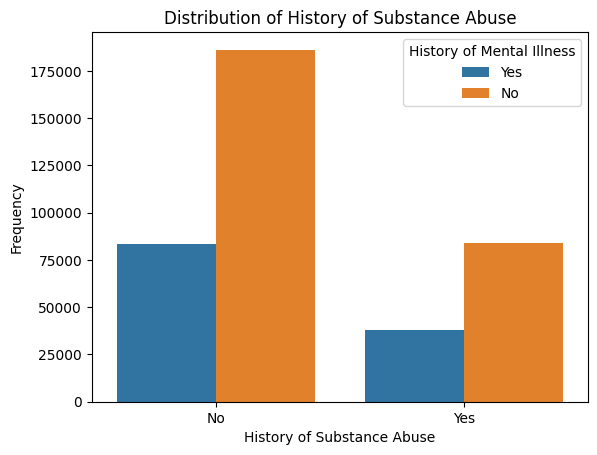

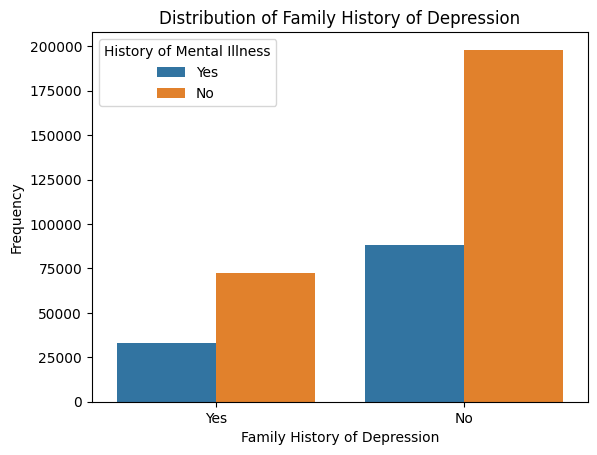

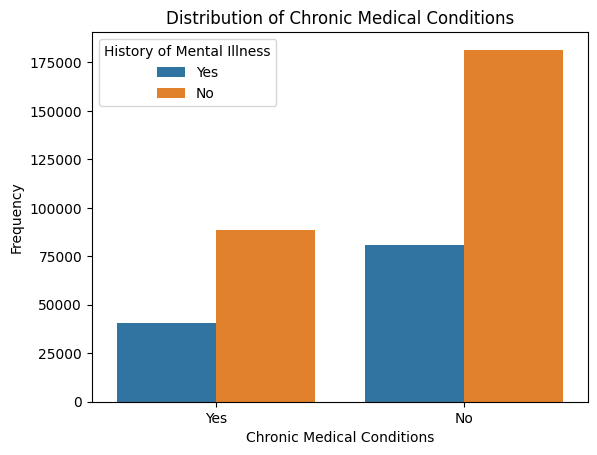

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


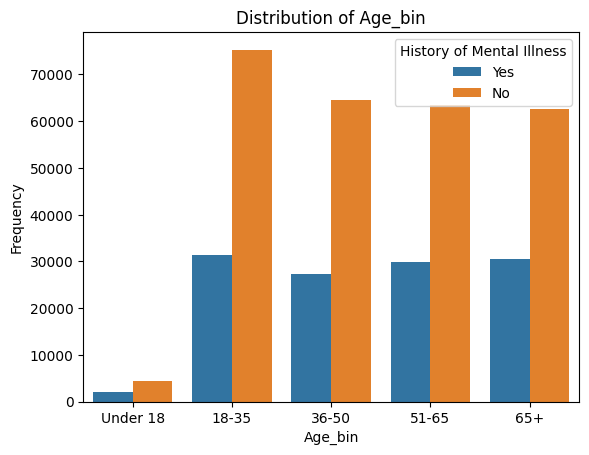

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


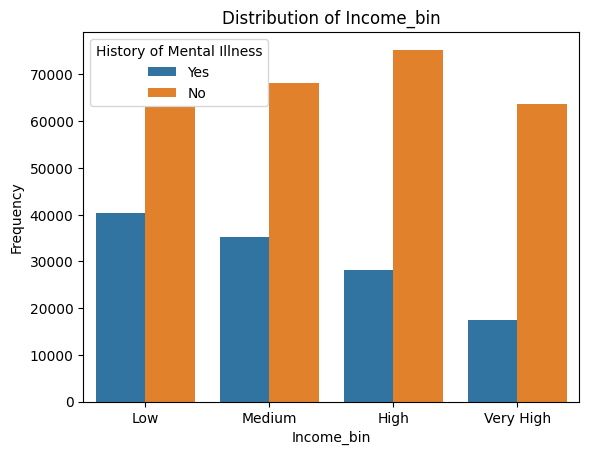

In [14]:
#Two Features

#Features to Target

for feature in df1_num:
    plt.figure(figsize=(8, 6))
    if feature == "Number of Children":
        sns.countplot(data=df1, x=feature, hue='History of Mental Illness')
    else:
        sns.boxplot(data=df1, x='History of Mental Illness', y=feature)  # Adjusting to plot boxplot by 'History of Mental Illness'
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency' if feature == "Number of Children" else 'Value')
    plt.grid(False)  # Disable gridlines
    plt.show()

for feature in df1_cat:
    sns.countplot(df1,x=feature,hue='History of Mental Illness')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(False)  # Disable gridlines
    plt.show()

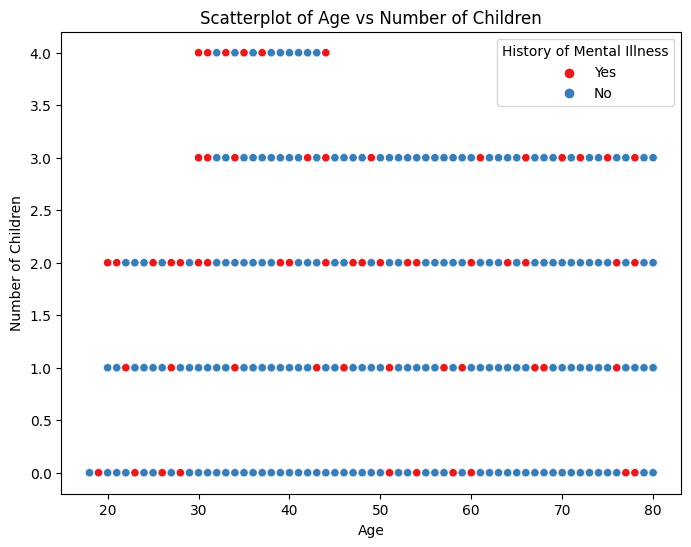

Creating legend with loc="best" can be slow with large amounts of data.


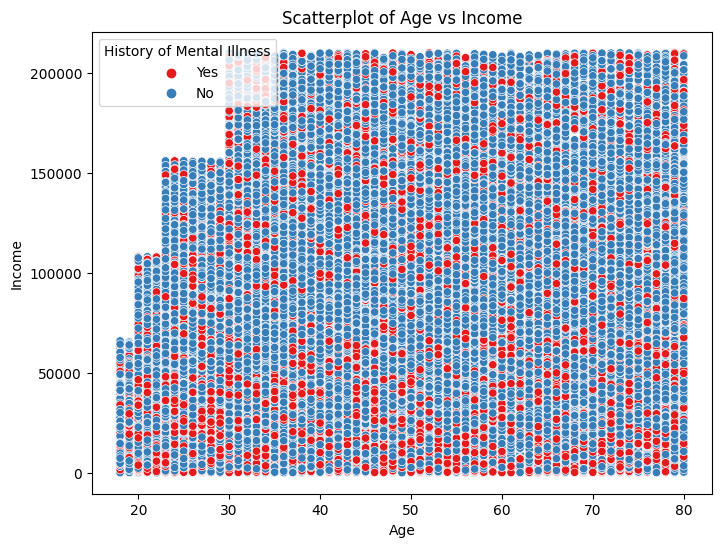

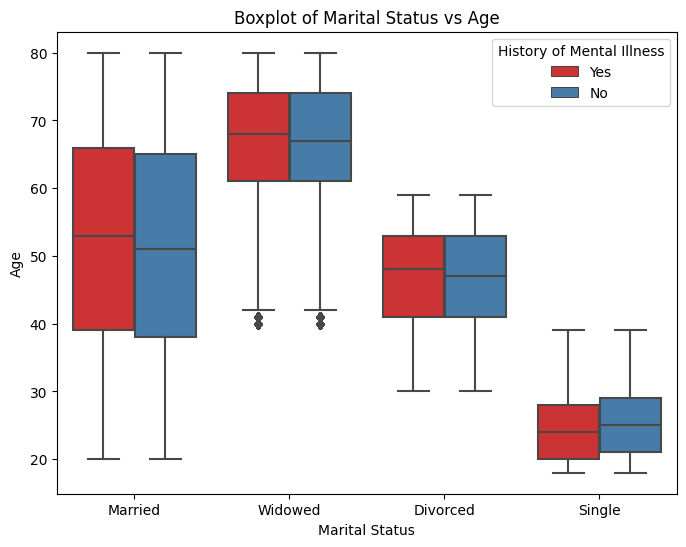

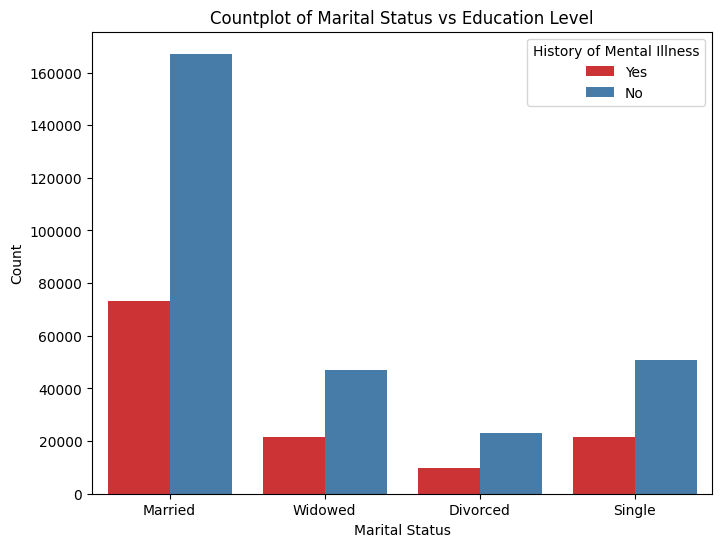

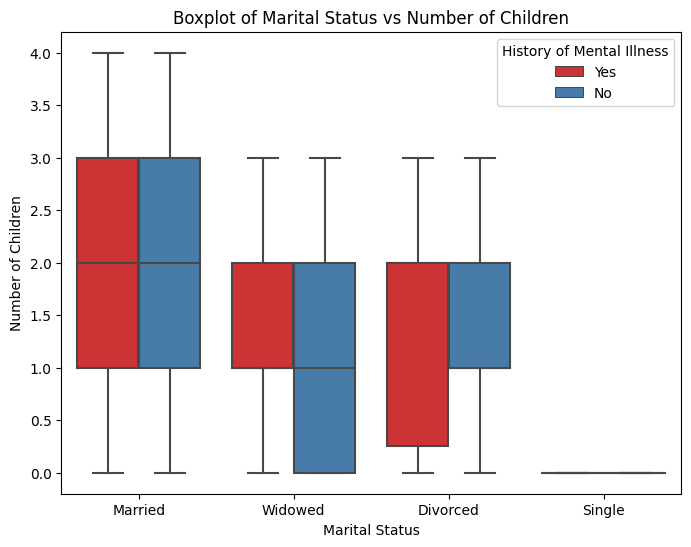

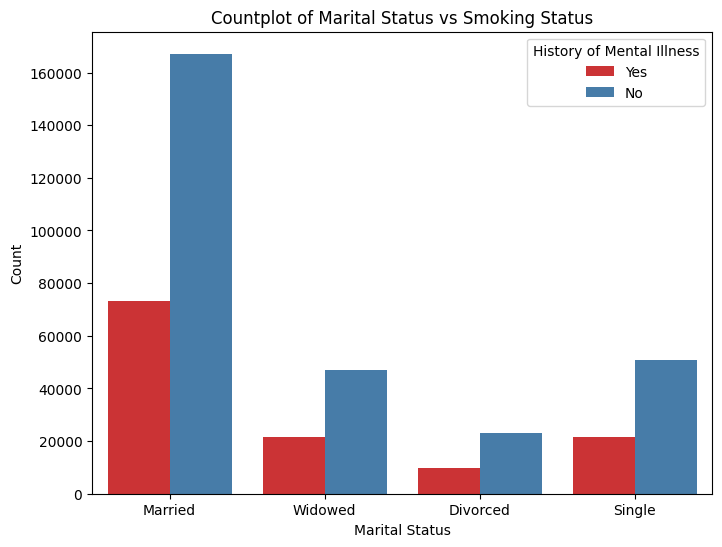

...

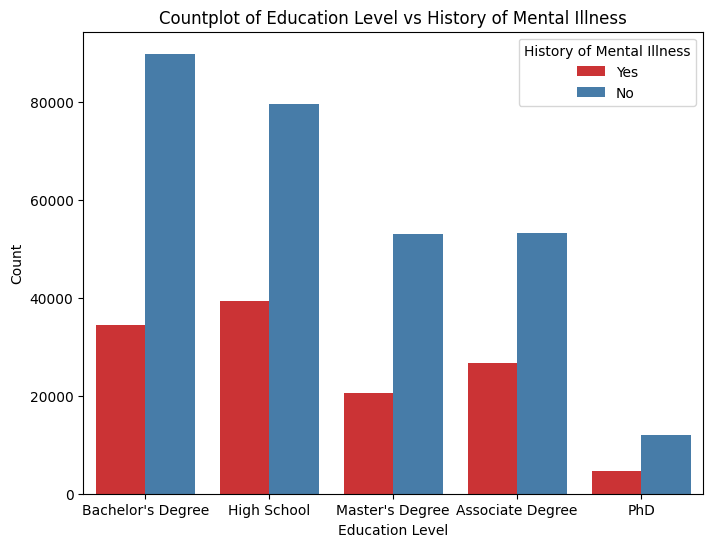

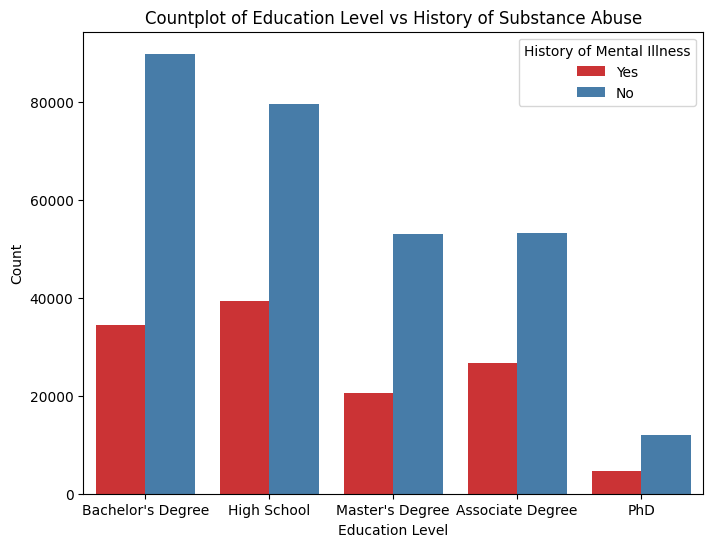

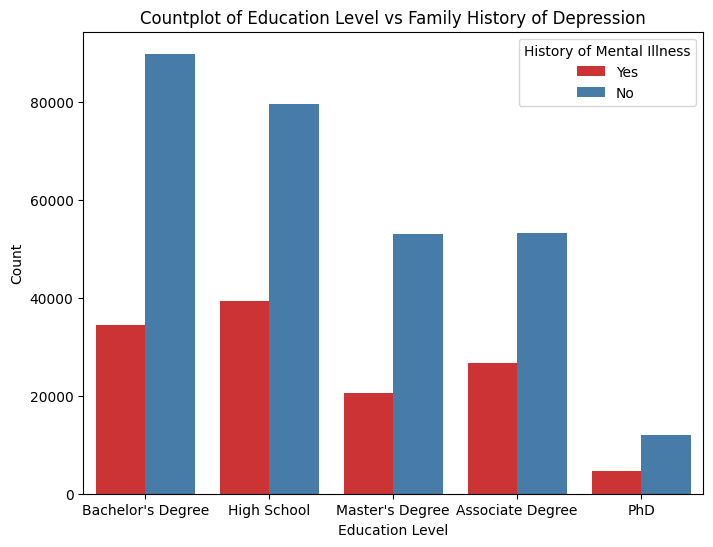

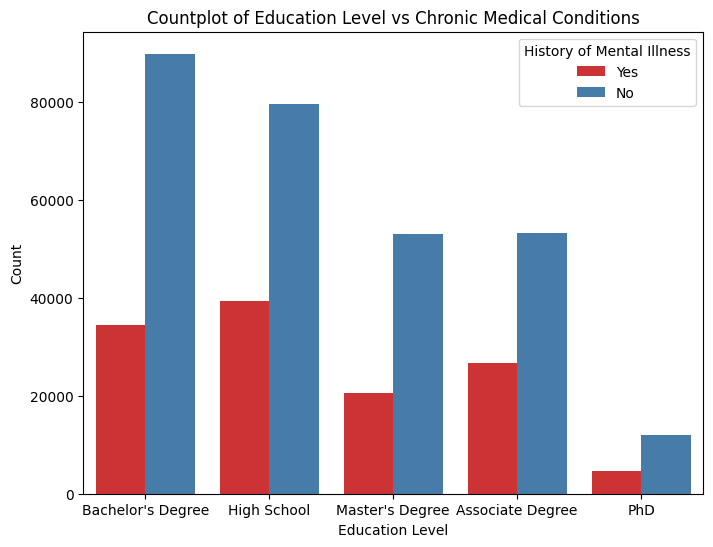

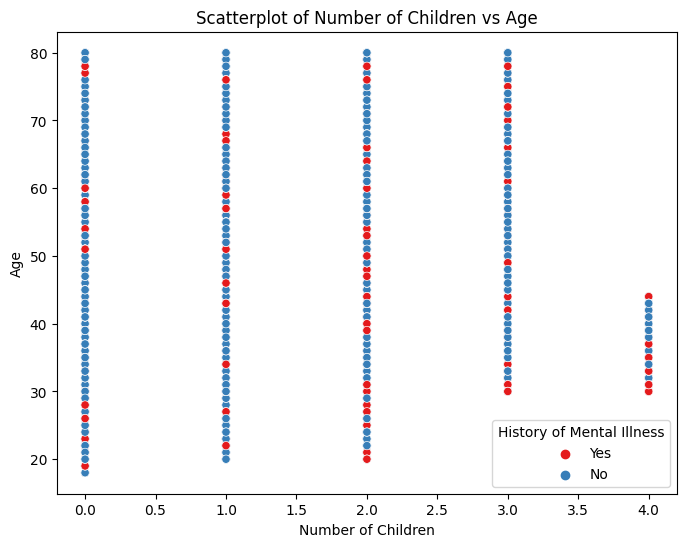

Creating legend with loc="best" can be slow with large amounts of data.


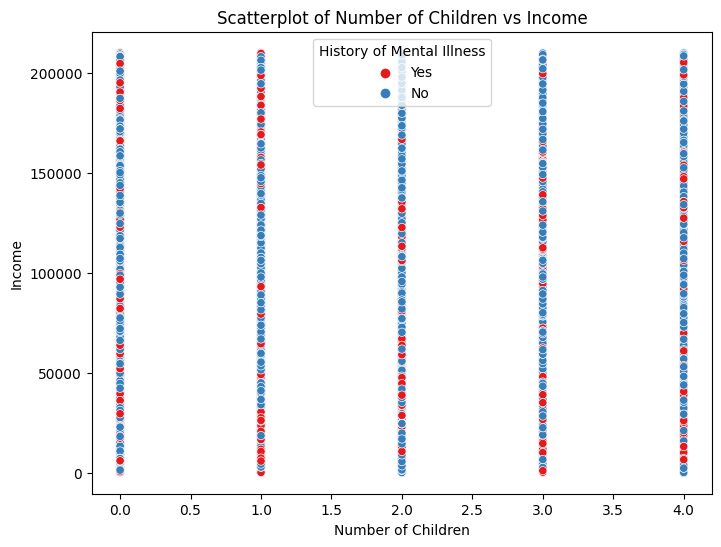

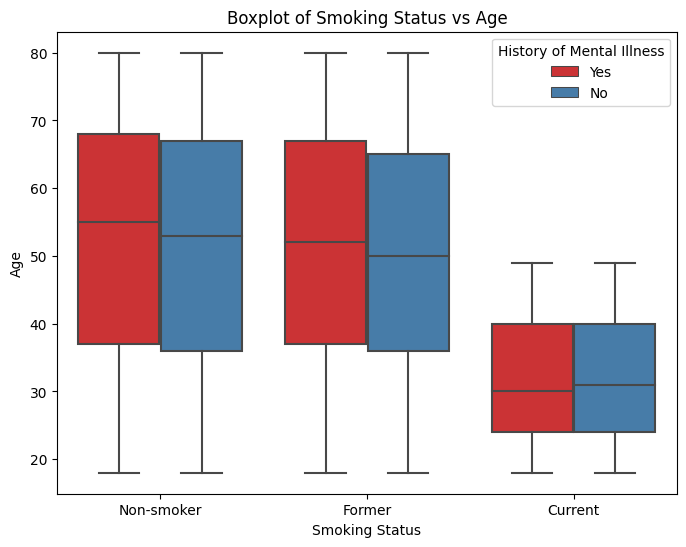

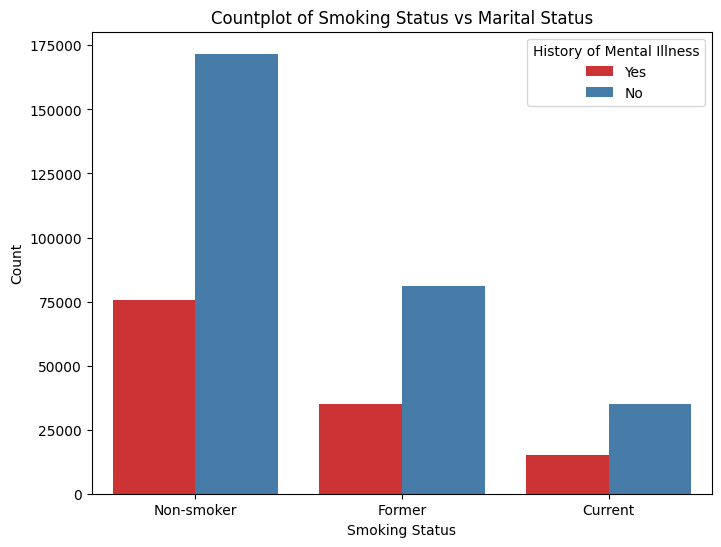

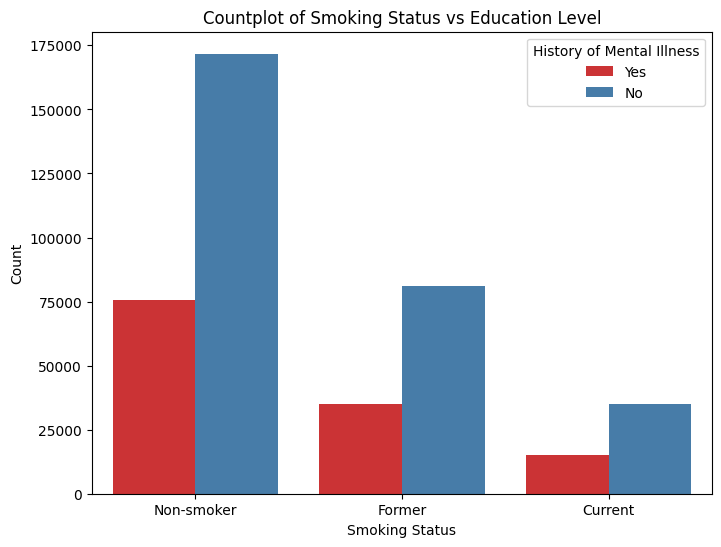

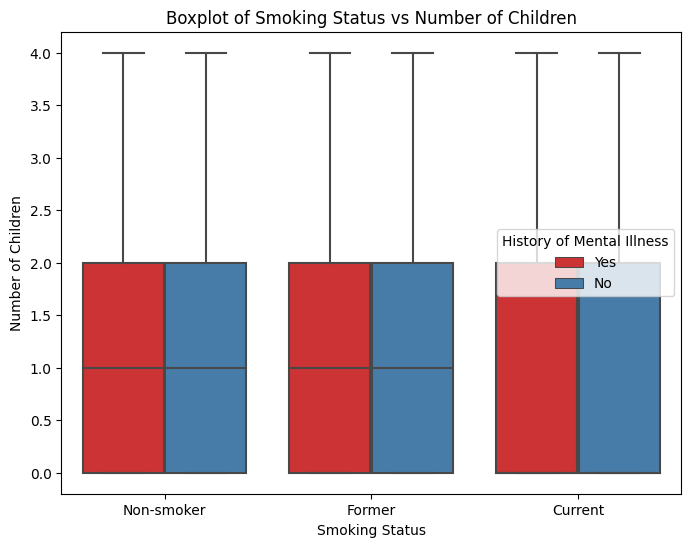

...

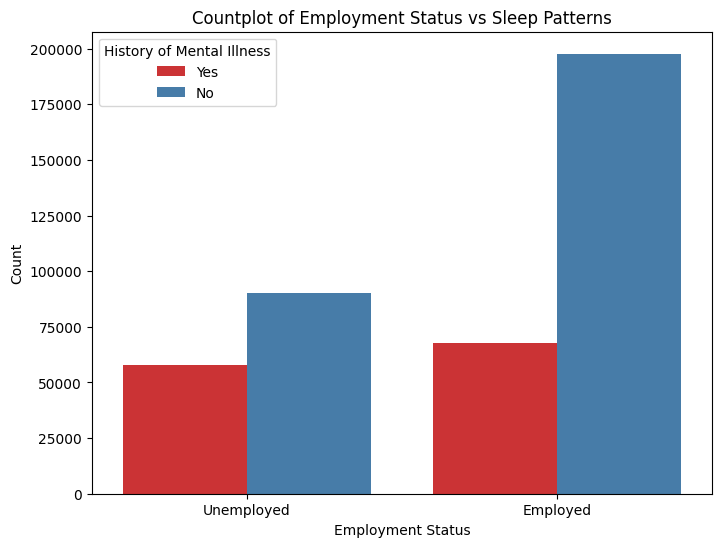

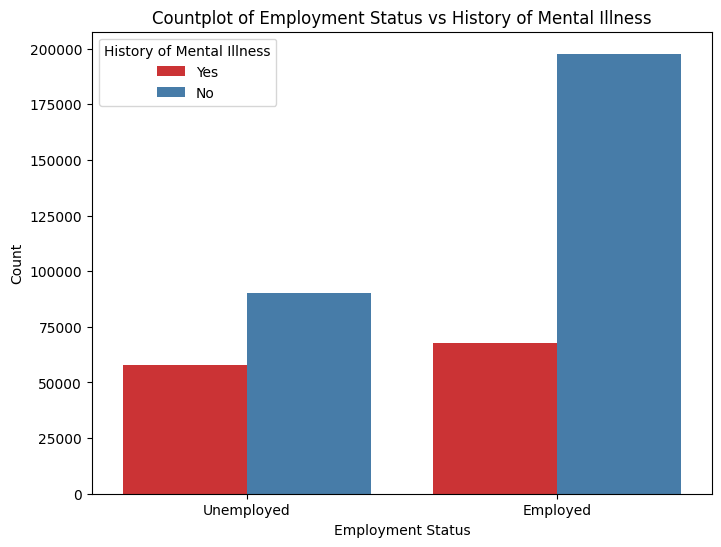

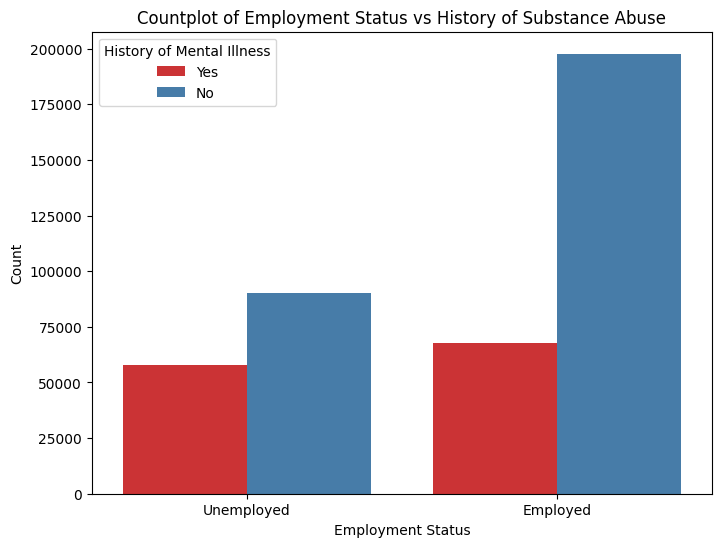

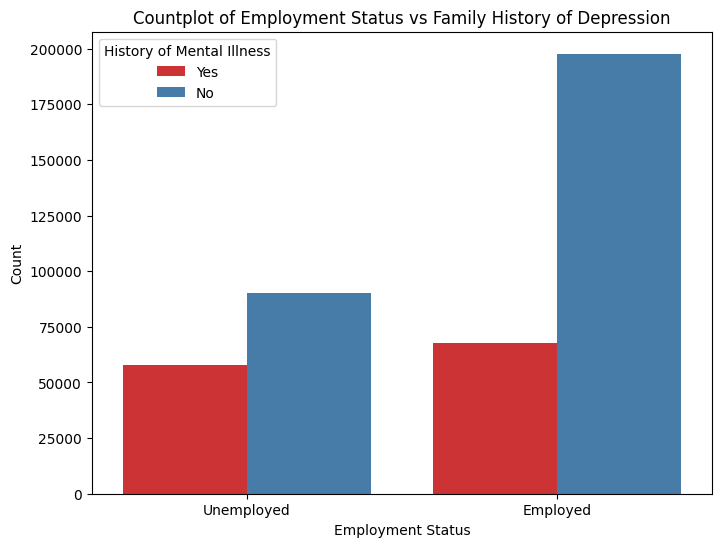

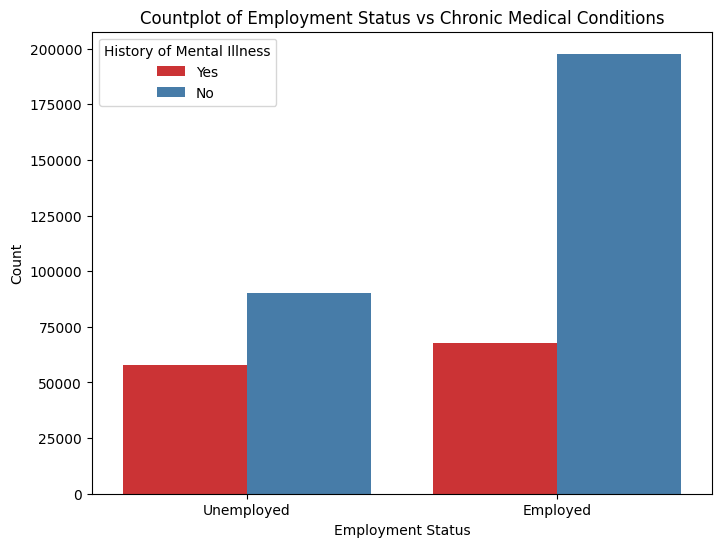

Creating legend with loc="best" can be slow with large amounts of data.


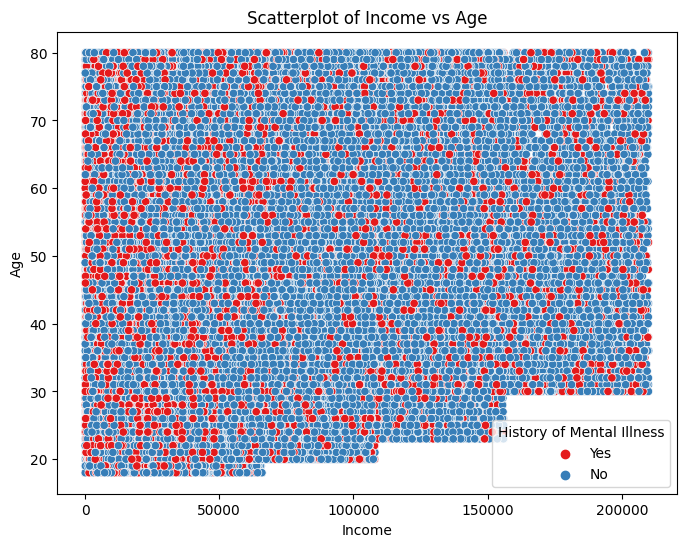

Creating legend with loc="best" can be slow with large amounts of data.


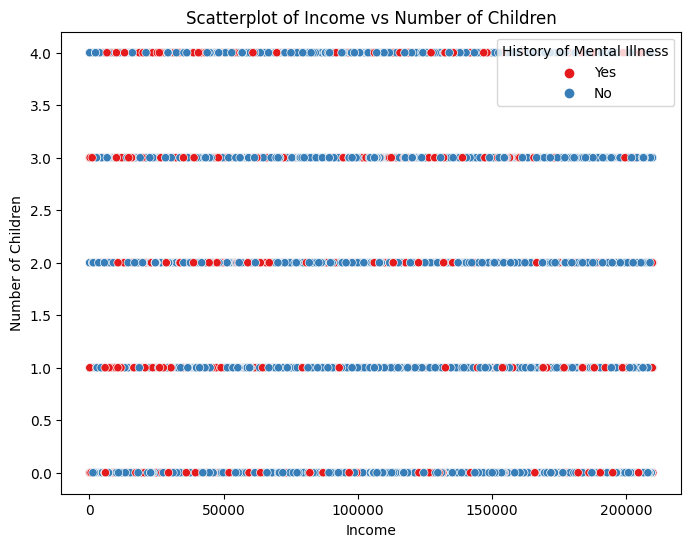

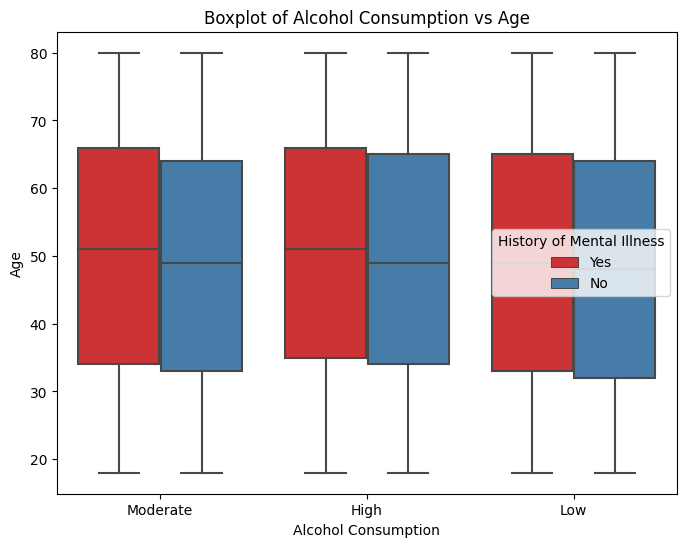

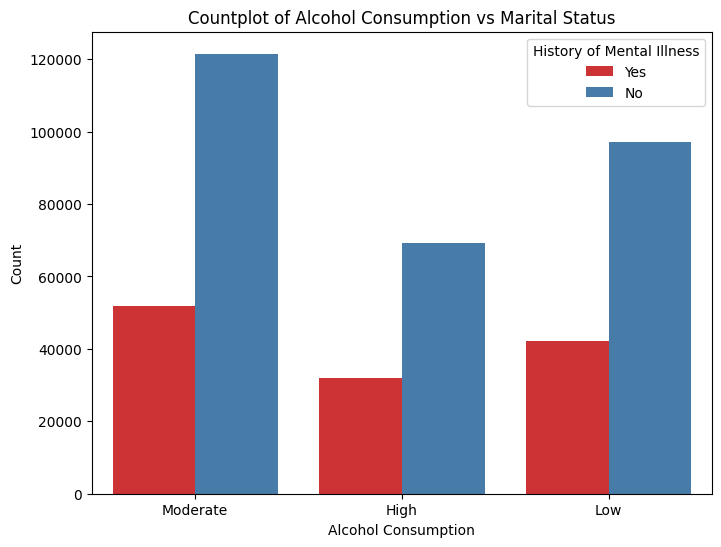

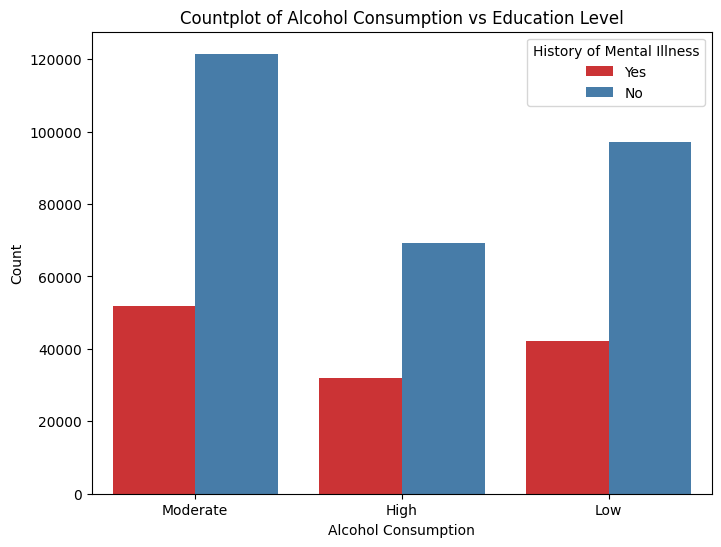

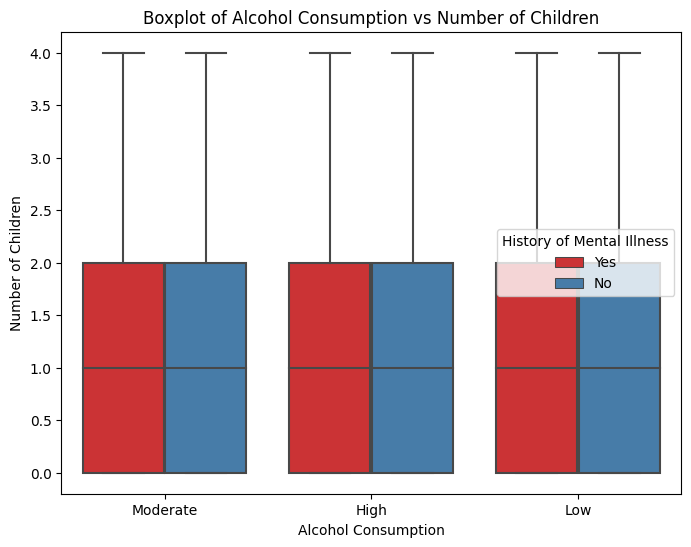

...

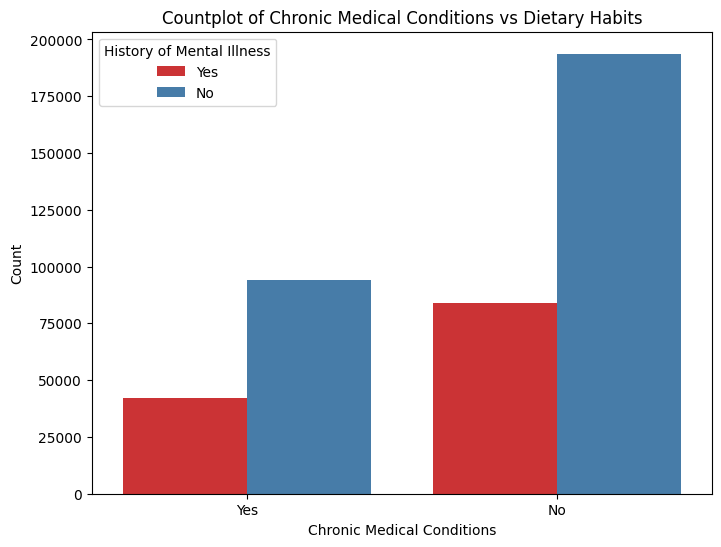

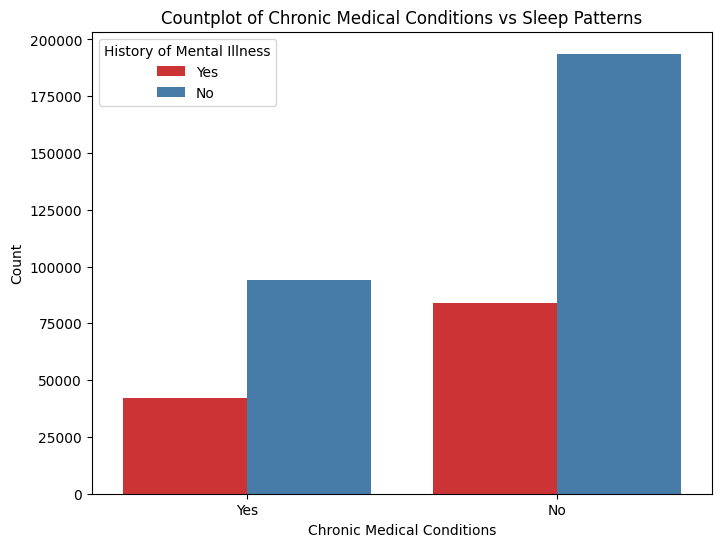

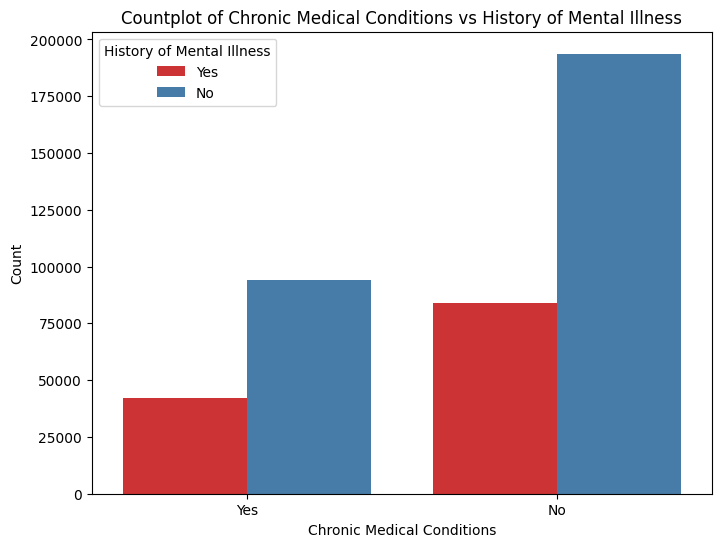

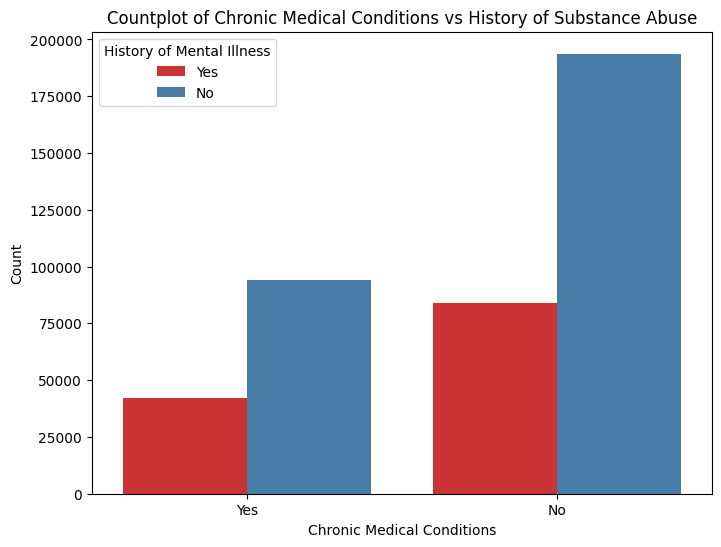

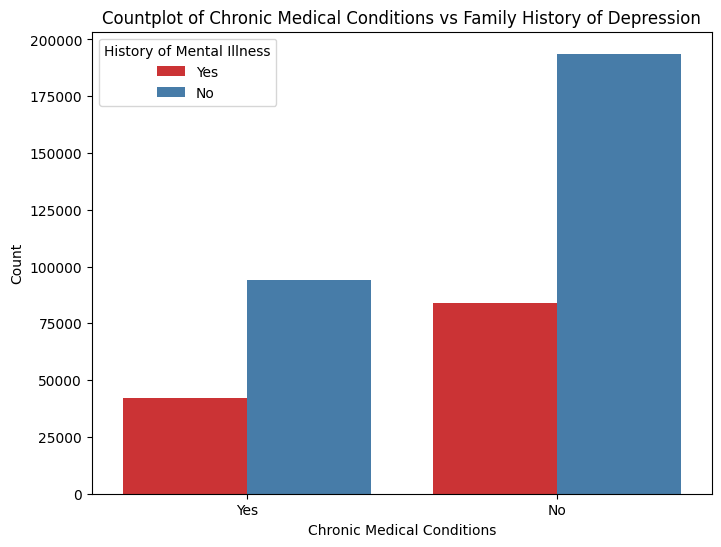

In [15]:
#Features to Features
for col1 in df.columns:
    for col2 in df.columns:
        if col1 != col2:
            if (col1 in df1_cat) and (col2 in df1_cat):
                plt.figure(figsize=(8, 6))
                sns.countplot(data=df, x=col1, hue='History of Mental Illness', palette='Set1')
                plt.title(f'Countplot of {col1} vs {col2}')
                plt.ylabel('Count')
                plt.show()

            elif (col1 in df1_cat) and (col2 in df1_num):
                plt.figure(figsize=(8, 6))
                sns.boxplot(data=df, x=col1, y=col2, hue='History of Mental Illness', palette='Set1')
                plt.title(f'Boxplot of {col1} vs {col2}')
                plt.ylabel(col2)
                plt.show()

            elif (col1 in df1_num) and (col2 in df1_num):
                plt.figure(figsize=(8, 6))
                sns.scatterplot(data=df, x=col1, y=col2, hue='History of Mental Illness', palette='Set1')
                plt.title(f'Scatterplot of {col1} vs {col2}')
                plt.ylabel(col2)
                plt.show()

# **Statistical Analysis** # 

Hal ini bertujuan untuk menganalisis fitur yang memiliki hubungan dengan status depresi (mental illness) dan membuang fitur yang memiliki multikolinaritas).

#### Associaton between Independent and Dependent Features

In [16]:
#THROW AWAY SUBSTANCE
from scipy.stats import chi2_contingency
from statsmodels.stats.contingency_tables import Table

categorical= df1.select_dtypes(include=['object','category']).drop(columns=["History of Mental Illness"])
ordinal_columns =['Education Level','Physical Activity Level','Alcohol Consumption','Dietary Habits','Sleep Patterns','Income_bin','Age_bin']

for column in categorical.columns:
    if column not in ordinal_columns:
        data = pd.crosstab(df1[column],df1['History of Mental Illness'])
        contingency_table = Table(data.values)
        chi_square_test = contingency_table.test_nominal_association()
        print(f"The p-value CHI score for {column} and Mental Illness",chi_square_test)
    else:
        data = pd.crosstab(df1[column], df1['History of Mental Illness'])
        contingency_table = Table(data.values)
        chi_square_test = contingency_table.test_ordinal_association()
        print(f"Chi-Square Ordinal for {column} and Mental Illness: {chi_square_test}")

The p-value CHI score for Marital Status and Mental Illness df          3
pvalue      0.0
statistic   79.73496562859114
Chi-Square Ordinal for Education Level and Mental Illness: null_mean   177835.06104788606
null_sd     302.2846962300001
pvalue      0.7885751859531827
statistic   177754.0
zscore      -0.268161269482146
The p-value CHI score for Smoking Status and Mental Illness df          2
pvalue      4.760557960059586e-07
statistic   29.115461542234883
Chi-Square Ordinal for Physical Activity Level and Mental Illness: null_mean   149369.4224998275
null_sd     217.18353781159698
pvalue      9.1086109521844e-11
statistic   150777.0
zscore      6.481050609800646
The p-value CHI score for Employment Status and Mental Illness df          1
pvalue      0.0
statistic   7397.365116627932
Chi-Square Ordinal for Alcohol Consumption and Mental Illness: null_mean   142185.2581584173
null_sd     229.63989821217763
pvalue      3.746766630498835e-14
statistic   140447.0
zscore      -7.5694954228

<Axes: >

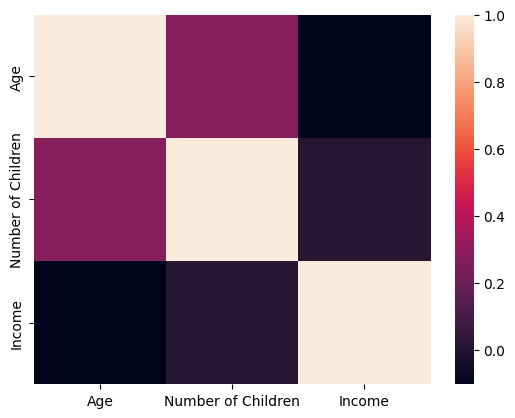

In [17]:
import seaborn as sns
numerical = df1.select_dtypes(include=['int64','float64'])
sns.heatmap(numerical.corr(method='pearson'))

In [18]:
from scipy.stats import kruskal

for column in numerical.columns:
  yes = df1[df1["History of Mental Illness"]=="Yes"][column]
  no  = df1[df1["History of Mental Illness"]=="No"][column]
  p = kruskal(yes, no)
  print(f"The significance score for {column} and Mental Illness",p.pvalue)

The significance score for Age and Mental Illness 1.129947860559714e-68
The significance score for Number of Children and Mental Illness 0.0006994597628271302
The significance score for Income and Mental Illness 0.0


In [19]:
categorical.columns

Index(['Marital Status', 'Education Level', 'Smoking Status',
       'Physical Activity Level', 'Employment Status', 'Alcohol Consumption',
       'Dietary Habits', 'Sleep Patterns', 'History of Substance Abuse',
       'Family History of Depression', 'Chronic Medical Conditions', 'Age_bin',
       'Income_bin'],
      dtype='object')

#### **Multicollinearity Check (VIF)**

In [20]:
X = df2.drop(columns=["Substance_Abuse","Education_Level","Mental_Illness"])
y = df2["Mental_Illness"]

In [21]:
def calculate_gvif(X):
    gvif = np.array([variance_inflation_factor(X.values, i) for i in range(X.shape[1])])
    gvif_df = pd.DataFrame({'Variable': X.columns, 'GVIF': gvif})
    return gvif_df

# Calculate initial GVIF
gvif_df = calculate_gvif(X)

# Loop to remove columns with GVIF > 5
while gvif_df['GVIF'].max() > 5:
    # Find the column with the highest GVIF
    max_vif_col = gvif_df.loc[gvif_df['GVIF'].idxmax(), 'Variable']

    # Remove the column with the highest GVIF
    X = X.drop(max_vif_col, axis=1)

    # Recalculate GVIF
    gvif_df = calculate_gvif(X)

# Final GVIF results
print("Final GVIF after removing high VIF columns:")
print(gvif_df)

Final GVIF after removing high VIF columns:
               Variable      GVIF
0                   Age  1.958022
1    Number of Children  1.413918
2                Income  2.236119
3              Divorced  1.419570
4               Married  3.885681
5               Widowed  2.562201
6               Current  1.377345
7                Former  1.433771
8      Physics_Activity  2.565697
9   Alcohol_Consumption  2.349300
10          Diet_Habits  2.456110
11       Sleep_Patterns  2.709240
12    Employment_Status  3.535282
13   FamHist_Depression  1.430280
14  ChronicMedCondition  1.472557


# **Feature Engineering** # 

Membuat fitur baru "Lifestyle" dari berbagai fitur yang berkaitan dengan gaya hidup seseorang sebagai pertimbagan untuk mengurangi fitur kategorik dan diharapkan dapat memberikan hasil prediksi yang lebih baik.

In [22]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 1)

X_pca= X.copy()
X_pca["LifeStyle"]= pca.fit_transform(X_pca[["Physics_Activity","Alcohol_Consumption","Diet_Habits","Sleep_Patterns","Current","Former"]])

X_pca= X_pca.drop(columns=["Physics_Activity","Alcohol_Consumption","Diet_Habits","Sleep_Patterns","Current","Former"])

# **Modelling and Evaluations** # 

Akan dilakukan prediksi dan evaluasi model untuk mengidentifikasi model dan trial mana yang dapat memberikan hasil prediksi yang akurat.

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.1,random_state=42)
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca,y,test_size=0.1,random_state=42)

print(y_train.value_counts())
print(y_test.value_counts())

Mental_Illness
0    243232
1    108922
Name: count, dtype: int64
Mental_Illness
0    26995
1    12134
Name: count, dtype: int64


In [24]:
print(y_train.value_counts())
print(y_test.value_counts())
print(y_train_pca.value_counts())
print(y_test_pca.value_counts())

Mental_Illness
0    243232
1    108922
Name: count, dtype: int64
Mental_Illness
0    26995
1    12134
Name: count, dtype: int64
Mental_Illness
0    243232
1    108922
Name: count, dtype: int64
Mental_Illness
0    26995
1    12134
Name: count, dtype: int64


# **Oversampling, Undersampling, Random Sampling** # 

Akan dilakukan Oversampling melalui SMOTE atau memperbanyak data dengan kelas minoritas, Undersampling mempersedikit data dengan kelas mayoritas, Random Sampling (1000 untuk setiap klasifikasi depresi) untuk dataframe yang non-PCA dan PCA (yang mengandung "Lifestyle"). 

In [25]:
#NON-PCA

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
import pandas as pd

# Assuming X_train and y_train are already defined

# Oversampling
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train, y_train)
print("Oversampling: ", y_res.value_counts())
# Store oversampling results in variables 
X_train_oversampled = X_res  
y_train_oversampled = y_res  

# Undersampling
un = RandomUnderSampler(random_state=42)
X_under, y_under = un.fit_resample(X_train, y_train)
print("Undersampling: ", y_under.value_counts())
# Store undersampling results in variables 
X_train_undersampled = X_under  
y_train_undersampled = y_under  

# Random Sampling
train_data = pd.concat([X_train, y_train], axis=1)
yes_class = train_data[train_data['Mental_Illness'] == 1]  # Assuming 1 for 'yes'
no_class = train_data[train_data['Mental_Illness'] == 0]   # Assuming 0 for 'no'

# Randomly sample 1000 instances from each class
yes_sample = yes_class.sample(n=1000, random_state=42)
no_sample = no_class.sample(n=1000, random_state=42)

# Combine the samples back together
balanced_train_data = pd.concat([yes_sample, no_sample])

# Shuffle the dataset
balanced_train_data = balanced_train_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Split the data back into X and y
X_train_rand = balanced_train_data.drop('Mental_Illness', axis=1)
y_train_rand = balanced_train_data['Mental_Illness']

print("Random Sampling =: ", y_train_rand.value_counts())
# Store random sampling results in variables 
X_train_random = X_train_rand  
y_train_random = y_train_rand  


Oversampling:  Mental_Illness
1    243232
0    243232
Name: count, dtype: int64
Undersampling:  Mental_Illness
0    108922
1    108922
Name: count, dtype: int64
Random Sampling =:  Mental_Illness
0    1000
1    1000
Name: count, dtype: int64


In [26]:
#PCA

# Assuming X_train_pca and y_train_pca are already defined

# Oversampling
sm = SMOTE(random_state=42)
X_res_pca, y_res_pca = sm.fit_resample(X_train_pca, y_train_pca)
print("Oversampling (PCA): ", y_res_pca.value_counts())
# Store oversampling results in variables
X_train_oversampled_pca = X_res_pca  
y_train_oversampled_pca = y_res_pca  

# Undersampling
un = RandomUnderSampler(random_state=42)
X_under_pca, y_under_pca = un.fit_resample(X_train_pca, y_train_pca)
print("Undersampling (PCA): ", y_under_pca.value_counts())
# Store undersampling results in variables 
X_train_undersampled_pca = X_under_pca  
y_train_undersampled_pca = y_under_pca  

# Random Sampling
train_data_pca = pd.concat([X_train_pca, y_train_pca], axis=1)
yes_class_pca = train_data_pca[train_data_pca['Mental_Illness'] == 1]
no_class_pca = train_data_pca[train_data_pca['Mental_Illness'] == 0]

# Randomly sample 1000 instances from each class
yes_sample_pca = yes_class_pca.sample(n=1000, random_state=42)
no_sample_pca = no_class_pca.sample(n=1000, random_state=42)

# Combine the samples back together
balanced_train_data_pca = pd.concat([yes_sample_pca, no_sample_pca])

# Shuffle the dataset
balanced_train_data_pca = balanced_train_data_pca.sample(frac=1, random_state=42).reset_index(drop=True)

# Split the data back into X and y
X_train_rand_pca = balanced_train_data_pca.drop('Mental_Illness', axis=1)
y_train_rand_pca = balanced_train_data_pca['Mental_Illness']

print("Random Sampling (PCA) =: ", y_train_rand_pca.value_counts())
# Store random sampling results in variables 
X_train_random_pca = X_train_rand_pca 
y_train_random_pca = y_train_rand_pca  


Oversampling (PCA):  Mental_Illness
1    243232
0    243232
Name: count, dtype: int64
Undersampling (PCA):  Mental_Illness
0    108922
1    108922
Name: count, dtype: int64
Random Sampling (PCA) =:  Mental_Illness
0    1000
1    1000
Name: count, dtype: int64


# **Support Vector Machine (SVM)** # 
Mengidentifikasi batas keputusan dalam ruang berdimensi tinggi untuk mengklasifikasikan faktor depresi.

Non-PCA Trial: Regular


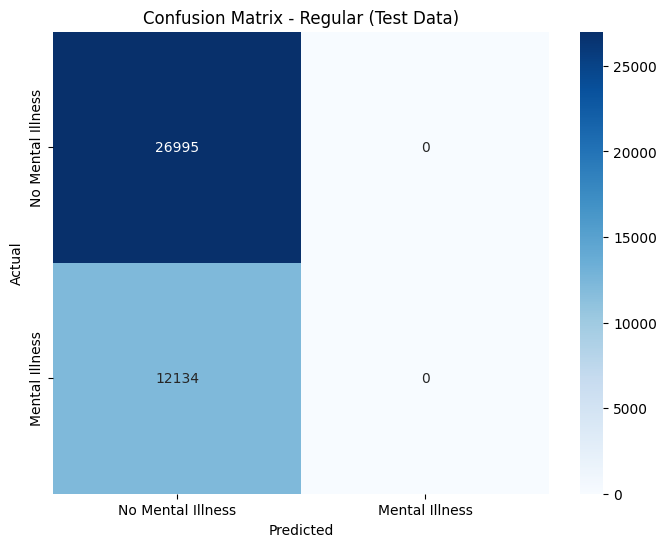

Train Balanced Acc: 0.5, Train F1 Score: 0.0, Test Balanced Acc: 0.5, Test F1 Score: 0.0


'\n# Analisis SHAP dengan subset\n# Pastikan X_test adalah DataFrame atau konversi jika berbentuk array\nif not isinstance(X_test, pd.DataFrame):\n    X_test = pd.DataFrame(X_test)\n\n# Pilih subset 100 sampel secara acak dari X_test\nsubset_X_test = X_test.sample(100, random_state=42)  # random_state untuk reproduktifitas\n\n# Gunakan SHAP KernelExplainer untuk model SVM\nexplainer = shap.KernelExplainer(best_svm.predict, X_train)\nshap_values = explainer.shap_values(subset_X_test)\n\n# Plot SHAP Summary (Bar)\nshap.summary_plot(shap_values, subset_X_test, plot_type="bar", show=False)\n\n# Tampilkan plot\nplt.gcf().set_size_inches(8, 6)\nplt.show()\n'

In [2]:
#With Hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, balanced_accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import shap
import pandas as pd

# NOTE: INI KODE EKSEKUSI LAMA DAN TIDAK CUKUP BISA DI RUN DI ENVIRONMENT KAGGLE

best_params_svm = {'C': 0.1, 'kernel': 'linear'}  # Obtained from running last time

# Fungsi utama untuk training dan evaluasi SVM
def train_evaluate_svm(X_train, y_train, X_test, y_test, trial_name):

    
    # Parameter grid yang disederhanakan untuk percepatan
    param_grid = {
        'C': [0.1, 1],               
        'kernel': ['linear'],         
    }

    # GridSearchCV dengan parameter yang dioptimalkan
    grid_search = GridSearchCV(SVC(random_state=42), param_grid=param_grid, scoring='accuracy', cv=3, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Model terbaik
    best_svm = grid_search.best_estimator_
    print(f"Best Parameters for {trial_name}: {grid_search.best_params_}")
    
    # Use predefined best parameters
    best_svm = SVC(**best_params_svm, random_state=42) 
    best_svm.fit(X_train, y_train)
    
    # Evaluasi model
    y_train_pred = best_svm.predict(X_train)
    y_test_pred = best_svm.predict(X_test)
    balanced_acc_train = balanced_accuracy_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)
    balanced_acc_test = balanced_accuracy_score(y_test, y_test_pred)
    f1_test = f1_score(y_test, y_test_pred)

    # Plot confusion matrix
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues',
                xticklabels=["No Mental Illness", "Mental Illness"],
                yticklabels=["No Mental Illness", "Mental Illness"])
    plt.title(f'Confusion Matrix - {trial_name} (Test Data)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    return best_svm, balanced_acc_train, f1_train, balanced_acc_test, f1_test

# Training dan evaluasi model
print("Non-PCA Trial: Regular")
best_svm, train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train, y_train, X_test, y_test, "Regular")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")

# Analisis SHAP dengan subset
# Pastikan X_test adalah DataFrame atau konversi jika berbentuk array
if not isinstance(X_test, pd.DataFrame):
    X_test = pd.DataFrame(X_test)

# Pilih subset 100 sampel secara acak dari X_test
subset_X_test = X_test.sample(100, random_state=42)  # random_state untuk reproduktifitas

# Gunakan SHAP KernelExplainer untuk model SVM
explainer = shap.KernelExplainer(best_svm.predict, X_train)
shap_values = explainer.shap_values(subset_X_test)

# Plot SHAP Summary (Bar)
shap.summary_plot(shap_values, subset_X_test, plot_type="bar", show=False)

# Tampilkan plot
plt.gcf().set_size_inches(8, 6)
plt.show()


Non-PCA Trial: Regular


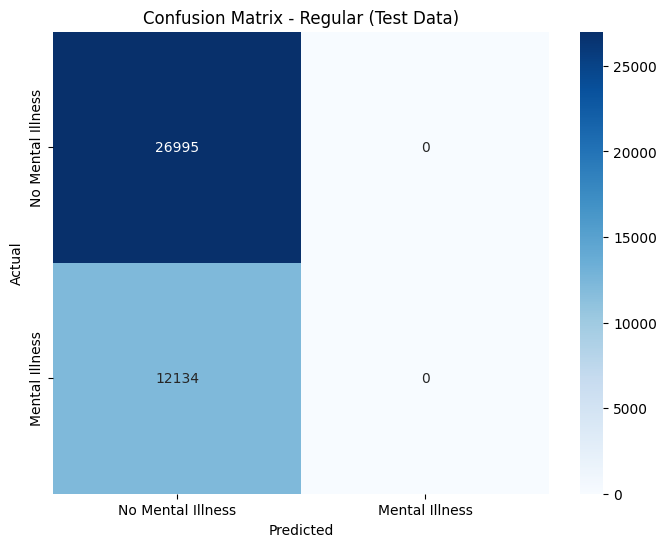

ValueError: too many values to unpack (expected 4)

In [29]:
# Trial Regular (Non-PCA)
print("Non-PCA Trial: Regular")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train, y_train, X_test, y_test, "Regular")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


Non-PCA Trial: Undersampled


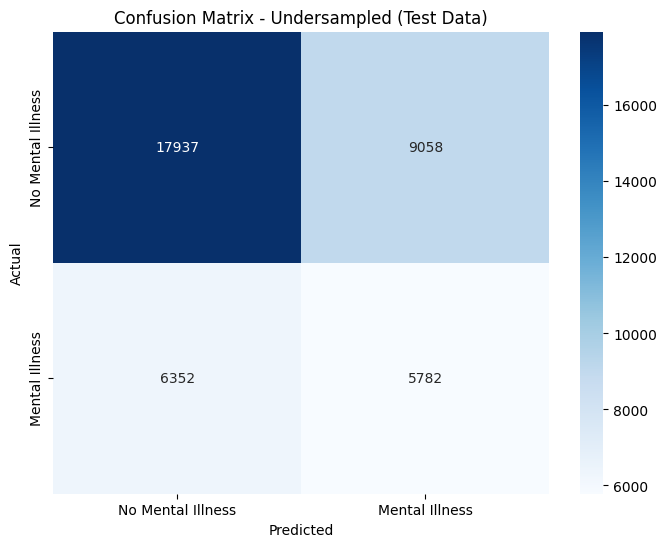

ValueError: too many values to unpack (expected 4)

In [1]:
# Trial Undersampled (Non-PCA)
print("Non-PCA Trial: Undersampled")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train_undersampled, y_train_undersampled, X_test, y_test, "Undersampled")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


Non-PCA Trial: Randomly Sampled


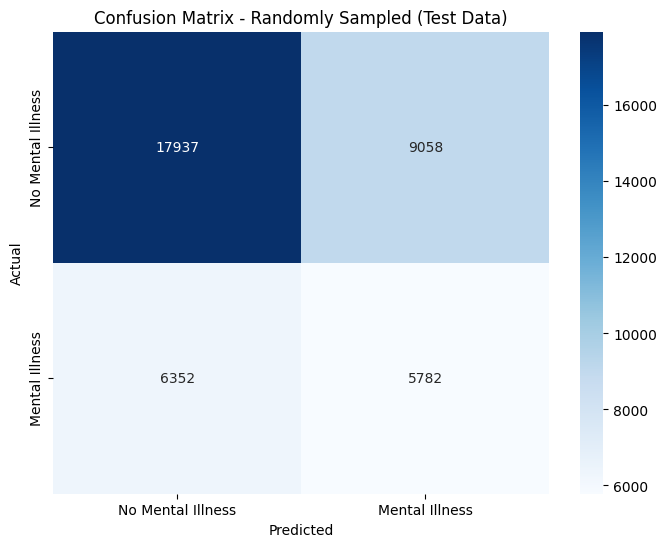

ValueError: too many values to unpack (expected 4)

In [1]:
# Trial Randomly Sampled (Non-PCA)
print("Non-PCA Trial: Randomly Sampled")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train_random, y_train_random, X_test, y_test, "Randomly Sampled")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


PCA Trial: Regular


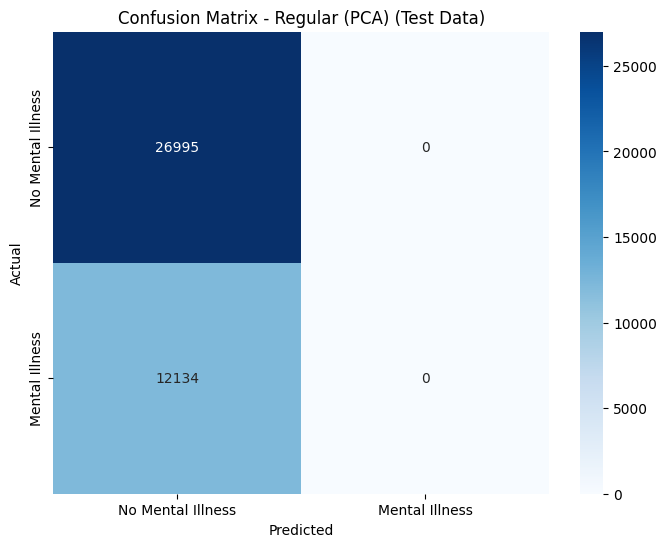

ValueError: too many values to unpack (expected 4)

In [2]:
# Trial Regular (PCA)
print("PCA Trial: Regular")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train_pca, y_train_pca, X_test_pca, y_test_pca, "Regular (PCA)")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


PCA Trial: Undersampled


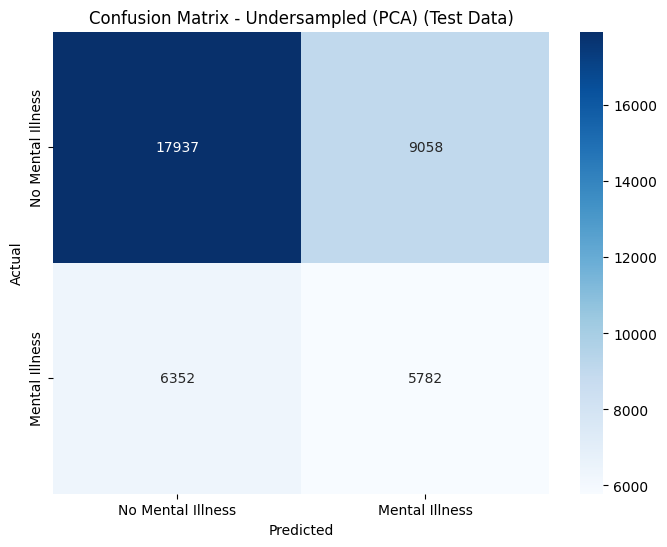

ValueError: too many values to unpack (expected 4)

In [3]:
# Trial Undersampled (PCA)
print("PCA Trial: Undersampled")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train_undersampled_pca, y_train_undersampled_pca, X_test_pca, y_test_pca, "Undersampled (PCA)")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


PCA Trial: Randomly Sampled


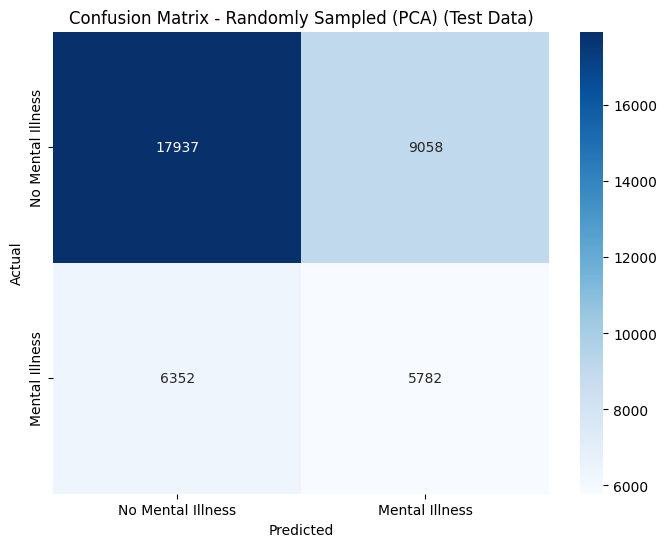

ValueError: too many values to unpack (expected 4)

In [4]:
# Trial Randomly Sampled (PCA)
print("PCA Trial: Randomly Sampled")
train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train_random_pca, y_train_random_pca, X_test_pca, y_test_pca, "Randomly Sampled (PCA)")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")


In [ ]:
# SHAP
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, balanced_accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import shap
import pandas as pd

# NOTE: INI KODE EKSEKUSI LAMA DAN TIDAK CUKUP BISA DI RUN DI ENVIRONMENT KAGGLE


# Fungsi utama untuk training dan evaluasi SVM
def train_evaluate_svm(X_train, y_train, X_test, y_test, trial_name):
    # Parameter grid yang disederhanakan untuk percepatan
    param_grid = {
        'C': [0.1, 1],               
        'kernel': ['linear'],         
    }

    # GridSearchCV dengan parameter yang dioptimalkan
    grid_search = GridSearchCV(SVC(random_state=42), param_grid=param_grid, scoring='accuracy', cv=3, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Model terbaik
    best_svm = grid_search.best_estimator_
    print(f"Best Parameters for {trial_name}: {grid_search.best_params_}")

    # Evaluasi model
    y_train_pred = best_svm.predict(X_train)
    y_test_pred = best_svm.predict(X_test)
    balanced_acc_train = balanced_accuracy_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)
    balanced_acc_test = balanced_accuracy_score(y_test, y_test_pred)
    f1_test = f1_score(y_test, y_test_pred)

    # Plot confusion matrix
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues',
                xticklabels=["No Mental Illness", "Mental Illness"],
                yticklabels=["No Mental Illness", "Mental Illness"])
    plt.title(f'Confusion Matrix - {trial_name} (Test Data)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    return best_svm, balanced_acc_train, f1_train, balanced_acc_test, f1_test

# Training dan evaluasi model
print("Non-PCA Trial: Regular")
best_svm, train_bal_acc, train_f1, test_bal_acc, test_f1 = train_evaluate_svm(X_train, y_train, X_test, y_test, "Regular")
print(f"Train Balanced Acc: {train_bal_acc}, Train F1 Score: {train_f1}, Test Balanced Acc: {test_bal_acc}, Test F1 Score: {test_f1}")

# Analisis SHAP dengan subset
# Pastikan X_test adalah DataFrame atau konversi jika berbentuk array
if not isinstance(X_test, pd.DataFrame):
    X_test = pd.DataFrame(X_test)

# Pilih subset 100 sampel secara acak dari X_test
subset_X_test = X_test.sample(100, random_state=42)  # random_state untuk reproduktifitas

# Gunakan SHAP KernelExplainer untuk model SVM
explainer = shap.KernelExplainer(best_svm.predict, X_train)
shap_values = explainer.shap_values(subset_X_test)

# Plot SHAP Summary (Bar)
shap.summary_plot(shap_values, subset_X_test, plot_type="bar", show=False)

# Tampilkan plot
plt.gcf().set_size_inches(8, 6)
plt.show()


In [ ]:
# Feature importance (global) dengan SHAP
# NOTE: INI KODE EKSEKUSI LAMA DAN TIDAK CUKUP BISA DI RUN DI ENVIRONMENT KAGGLE
# Pastikan X_test adalah DataFrame atau konversi jika berbentuk array
if not isinstance(X_test, pd.DataFrame):
    X_test = pd.DataFrame(X_test)

# Pilih subset 100 sampel secara acak dari X_test
subset_X_test = X_test.sample(100, random_state=42)  # random_state untuk reproduktifitas

# Gunakan SHAP KernelExplainer untuk model SVM
explainer = shap.KernelExplainer(best_svm.predict, X_train)
shap_values = explainer.shap_values(subset_X_test)

# Plot SHAP Summary (Feature Importance)
shap.summary_plot(shap_values, subset_X_test)

# Bar plot untuk menunjukkan pentingnya fitur secara rata-rata
shap.summary_plot(shap_values, subset_X_test, plot_type="bar")


  0%|          | 0/100 [00:00<?, ?it/s]

# **Random Forest (Classification)** # 
Membangun beberapa pohon keputusan dan menggabungkan outputnya untuk prediksi yang akurat.

In [1]:
# IMPORTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import balanced_accuracy_score, f1_score, confusion_matrix
import seaborn as sns
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd


f1_train (Non-PCA Regular): 0.5643
Balanced Accuracy (Non-PCA Regular): 0.5000


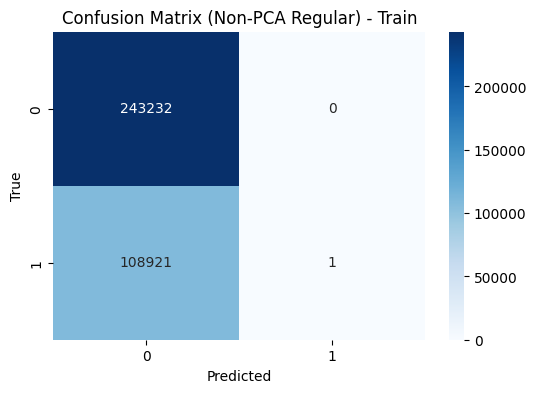

f1_test (Non-PCA Regular): 0.5633
Balanced Accuracy (Non-PCA Regular): 0.5000


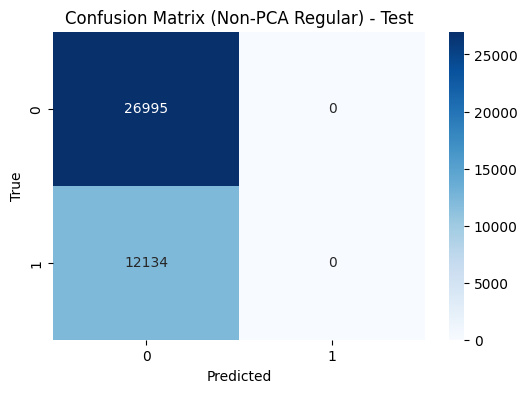

Code executed in 76.7818 seconds


In [2]:
# NON-PCA REGULAR

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier(n_jobs=2)

random_search_nonpca = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5)
random_search_nonpca.fit(X_train, y_train)

# Store the best parameters
best_params_nonpca = random_search_nonpca.best_params_
print("Best Parameters (Non-PCA Regular):", best_params_nonpca)

#Comment Code above if you want to use best params below
"""
#Best Param (obtained from running last time)
best_params_nonpca = {'n_estimators': 200,
'min_samples_split': 5,
'min_samples_leaf': 1,
'max_depth': 10
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_nonpca)
rf_model.fit(X_train, y_train)

# Predict on the training set
y_pred_train = rf_model.predict(X_train)

f1_train = f1_score(y_train, y_pred_train, average='weighted', labels=np.unique(y_train))
balanced_accuracy_train = balanced_accuracy_score(y_train, y_pred_train)

conf_matrix_train = confusion_matrix(y_train, y_pred_train)

print(f'f1_train (Non-PCA Regular): {f1_train:.4f}')
print(f'Balanced Accuracy (Non-PCA Regular): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Regular) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test)

f1_test = f1_score(y_test, y_pred_test, average='weighted', labels=np.unique(y_train))
balanced_accuracy_test = balanced_accuracy_score(y_test, y_pred_test)

conf_matrix_test = confusion_matrix(y_test, y_pred_test)

print(f'f1_test (Non-PCA Regular): {f1_test:.4f}')
print(f'Balanced Accuracy (Non-PCA Regular): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Regular) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
non_pca_regular_balanced_accuracy = balanced_accuracy_test
non_pca_regular_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (Non-PCA Random Sampling): 0.9230
Balanced Accuracy (Non-PCA Random Sampling): 0.9230


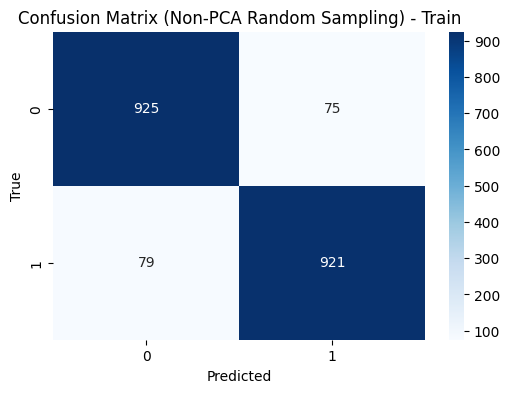

f1_test (Non-PCA Random Sampling): 0.5567
Balanced Accuracy (Non-PCA Random Sampling): 0.5431


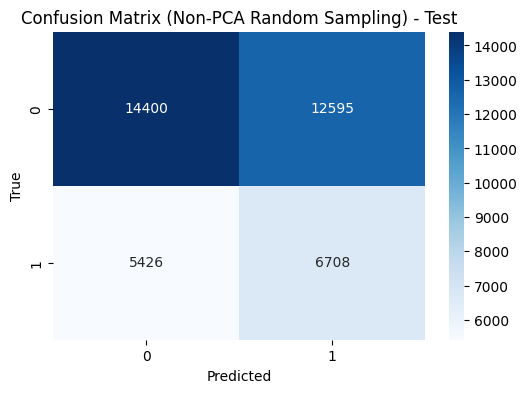

Code executed in 2.0576 seconds


In [5]:
# NON-PCA RANDOM SAMPLED

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier()

random_search_nonpca_rand = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5)
random_search_nonpca_rand.fit(X_train_rand, y_train_rand)

# Store the best parameters
best_params_nonpca_rand = random_search_nonpca_rand.best_params_
print("Best Parameters (Non-PCA Random Sampling):", best_params_nonpca_rand)

#Comment Code above if you want to use best params below
"""
#Best Param (obtained from running last time)
best_params_nonpca_rand = {'n_estimators': 200,
'min_samples_split': 5,
'min_samples_leaf': 1,
'max_depth': 10
}
"""
# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_nonpca_rand)
rf_model.fit(X_train_rand, y_train_rand)

# Predict on the training set
y_pred_train = rf_model.predict(X_train_rand)

f1_train = f1_score(y_train_rand, y_pred_train, average='weighted', labels=np.unique(y_train_rand))
balanced_accuracy_train = balanced_accuracy_score(y_train_rand, y_pred_train)

conf_matrix_train = confusion_matrix(y_train_rand, y_pred_train)

print(f'f1_train (Non-PCA Random Sampling): {f1_train:.4f}')
print(f'Balanced Accuracy (Non-PCA Random Sampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Random Sampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test)

f1_test = f1_score(y_test, y_pred_test, average='weighted', labels=np.unique(y_train_rand))
balanced_accuracy_test = balanced_accuracy_score(y_test, y_pred_test)

conf_matrix_test = confusion_matrix(y_test, y_pred_test)

print(f'f1_test (Non-PCA Random Sampling): {f1_test:.4f}')
print(f'Balanced Accuracy (Non-PCA Random Sampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Random Sampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
non_pca_random_sampling_balanced_accuracy = balanced_accuracy_test
non_pca_random_sampling_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (Non-PCA Oversampling): 1.0000
Balanced Accuracy (Non-PCA Oversampling): 1.0000


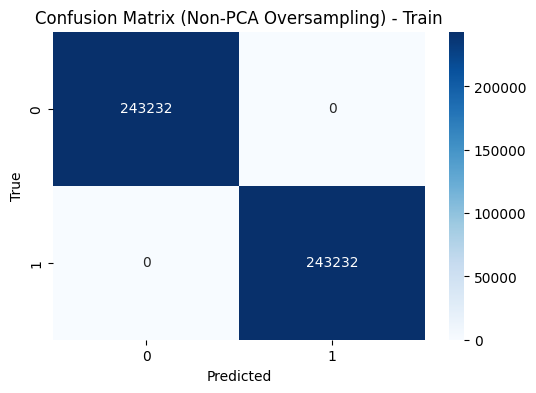

f1_test (Non-PCA Oversampling): 0.5956
Balanced Accuracy (Non-PCA Oversampling): 0.5215


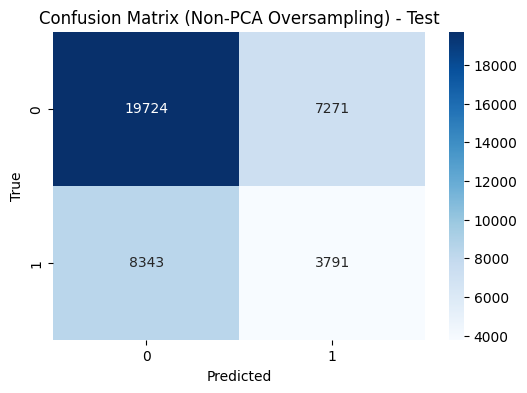

Code executed in 266.8831 seconds


In [7]:
# NON-PCA OVERSAMPLE

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier()

random_search_nonpca_over = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5)
random_search_nonpca_over.fit(X_res, y_res)

# Store the best parameters
best_params_nonpca_over = random_search_nonpca_over.best_params_
print("Best Parameters (Non-PCA Oversampling):", best_params_nonpca_over)

#Comment Code above if you want to use best params below
"""
#Best Param (obtained from running last time)
best_params_nonpca_over = {'n_estimators': 200,
'min_samples_split': 2,
'min_samples_leaf': 1,
'max_depth': None
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_nonpca_over)
rf_model.fit(X_res, y_res)

# Predict on the training set
y_pred_train = rf_model.predict(X_res)

f1_train = f1_score(y_res, y_pred_train, average='weighted', labels=np.unique(y_res))
balanced_accuracy_train = balanced_accuracy_score(y_res, y_pred_train)

conf_matrix_train = confusion_matrix(y_res, y_pred_train)

print(f'f1_train (Non-PCA Oversampling): {f1_train:.4f}')
print(f'Balanced Accuracy (Non-PCA Oversampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Oversampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test)

f1_test = f1_score(y_test, y_pred_test, average='weighted', labels=np.unique(y_res))
balanced_accuracy_test = balanced_accuracy_score(y_test, y_pred_test)

conf_matrix_test = confusion_matrix(y_test, y_pred_test)

print(f'f1_test (Non-PCA Oversampling): {f1_test:.4f}')
print(f'Balanced Accuracy (Non-PCA Oversampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Oversampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
non_pca_oversample_balanced_accuracy = balanced_accuracy_test
non_pca_oversample_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (Non-PCA Undersampling): 0.5942
Balanced Accuracy (Non-PCA Undersampling): 0.5963


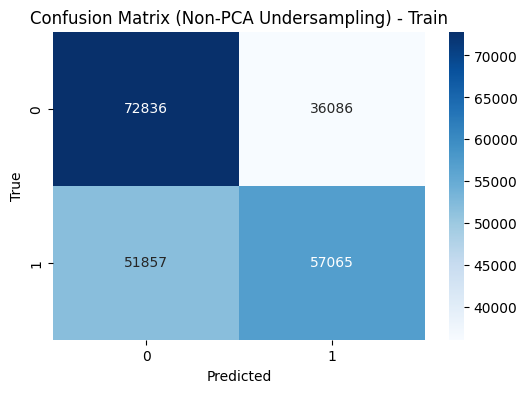

f1_test (Non-PCA Undersampling): 0.6108
Balanced Accuracy (Non-PCA Undersampling): 0.5711


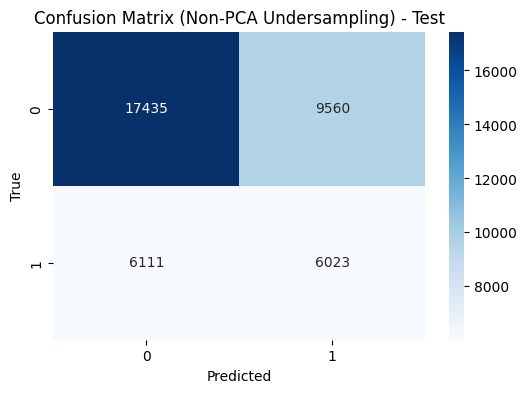

Code executed in 20.4629 seconds


In [8]:
# NON-PCA UNDERSAMPLE

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier()

random_search_nonpca_under = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5)
random_search_nonpca_under.fit(X_under, y_under)

# Store the best parameters
best_params_nonpca_under = random_search_nonpca_under.best_params_
print("Best Parameters (Non-PCA Undersampling):", best_params_nonpca_under)

#Comment Code above if you want to use best params below
"""
#Best Param (obtained from running last time)
best_params_nonpca_under = {'n_estimators': 100,
'min_samples_split': 2,
'min_samples_leaf': 2,
'max_depth': 10
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_nonpca_under)
rf_model.fit(X_under, y_under)

# Predict on the training set
y_pred_train = rf_model.predict(X_under)

f1_train = f1_score(y_under, y_pred_train, average='weighted', labels=np.unique(y_under))
balanced_accuracy_train = balanced_accuracy_score(y_under, y_pred_train)

conf_matrix_train = confusion_matrix(y_under, y_pred_train)

print(f'f1_train (Non-PCA Undersampling): {f1_train:.4f}')
print(f'Balanced Accuracy (Non-PCA Undersampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Undersampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test)

f1_test = f1_score(y_test, y_pred_test, average='weighted', labels=np.unique(y_test))  
balanced_accuracy_test = balanced_accuracy_score(y_test, y_pred_test)

conf_matrix_test = confusion_matrix(y_test, y_pred_test)

print(f'f1_test (Non-PCA Undersampling): {f1_test:.4f}')
print(f'Balanced Accuracy (Non-PCA Undersampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (Non-PCA Undersampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
non_pca_undersample_balanced_accuracy = balanced_accuracy_test
non_pca_undersample_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (PCA Regular): 0.5645
Balanced Accuracy (PCA Regular): 0.5001


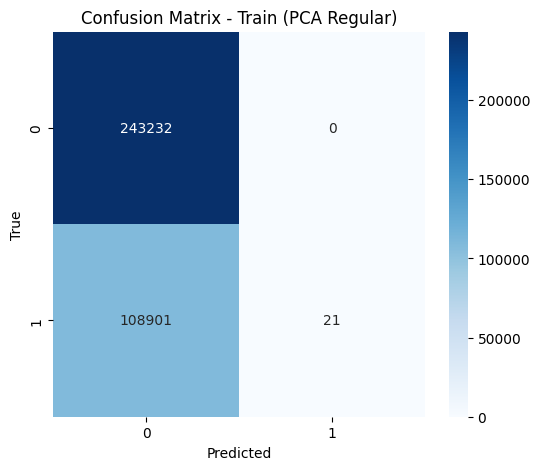

f1_test (PCA Regular): 0.5633
Balanced Accuracy (PCA Regular): 0.5000


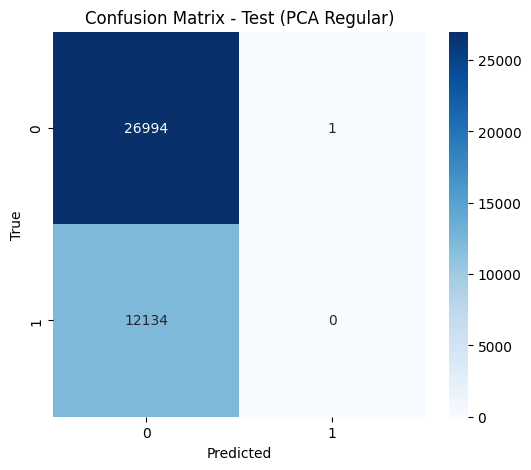

Code executed in 43.7980 seconds


In [26]:
# PCA REGULAR

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier(n_jobs=-1)

random_search_pca = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5, n_jobs=-1)
random_search_pca.fit(X_train_pca, y_train_pca)

# Store the best parameters
best_params_pca = random_search_pca.best_params_
print("Best Parameters (PCA Regular):", best_params_pca)

#Comment code above if you want to use best params below
"""
#Best Param (obtained from running last time)
best_params_pca = {'n_estimators': 100,
'min_samples_split': 2,
'min_samples_leaf': 2,
'max_depth': 10
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_pca)
rf_model.fit(X_train_pca, y_train_pca)

# Predict on the training set
y_pred_train = rf_model.predict(X_train_pca)

f1_train = f1_score(y_train_pca, y_pred_train, average='weighted', labels=np.unique(y_train_pca))
balanced_accuracy_train = balanced_accuracy_score(y_train_pca, y_pred_train)

conf_matrix_train = confusion_matrix(y_train_pca, y_pred_train)

print(f'f1_train (PCA Regular): {f1_train:.4f}')
print(f'Balanced Accuracy (PCA Regular): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 5))  
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap="Blues", xticklabels=np.unique(y_train_pca), yticklabels=np.unique(y_train_pca))
plt.title('Confusion Matrix - Train (PCA Regular)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()  

# Predict on the test set
y_pred_test = rf_model.predict(X_test_pca)
f1_test = f1_score(y_test_pca, y_pred_test, average='weighted', labels=np.unique(y_train_pca))
balanced_accuracy_test = balanced_accuracy_score(y_test_pca, y_pred_test)

conf_matrix_test = confusion_matrix(y_test_pca, y_pred_test)

print(f'f1_test (PCA Regular): {f1_test:.4f}')
print(f'Balanced Accuracy (PCA Regular): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 5)) 
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap="Blues", xticklabels=np.unique(y_train_pca), yticklabels=np.unique(y_train_pca))
plt.title('Confusion Matrix - Test (PCA Regular)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show() 

# Store results
pca_regular_balanced_accuracy = balanced_accuracy_test
pca_regular_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (PCA Random Sampling): 0.8960
Balanced Accuracy (PCA Random Sampling): 0.8960


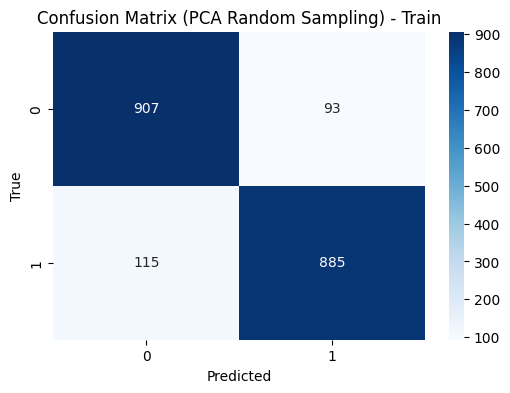

f1_test (PCA Random Sampling): 0.5581
Balanced Accuracy (PCA Random Sampling): 0.5420


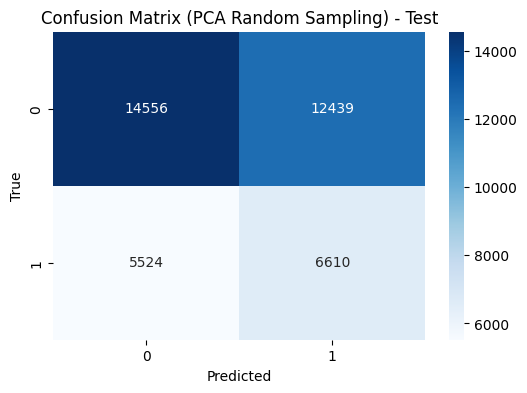

Code executed in 1.2048 seconds


In [10]:
# PCA RANDOM SAMPLED

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier(n_jobs=-1)

random_search_pca_rand = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5, n_jobs=-1)
random_search_pca_rand.fit(X_train_rand_pca, y_train_rand_pca)

# Store the best parameters
best_params_pca_rand = random_search_pca_rand.best_params_
print("Best Parameters (PCA Random Sampling):", best_params_pca_rand)

#Comment code above if you want to run using best params below
"""
#Best Param (obtained from running last time)
best_params_pca_rand = {'n_estimators': 100,
'min_samples_split': 5,
'min_samples_leaf': 1,
'max_depth': 10
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_pca_rand)
rf_model.fit(X_train_rand_pca, y_train_rand_pca)

# Predict on the training set
y_pred_train = rf_model.predict(X_train_rand_pca)
f1_train = f1_score(y_train_rand_pca, y_pred_train, average='weighted', labels=np.unique(y_train_rand_pca))
balanced_accuracy_train = balanced_accuracy_score(y_train_rand_pca, y_pred_train)

conf_matrix_train = confusion_matrix(y_train_rand_pca, y_pred_train)

print(f'f1_train (PCA Random Sampling): {f1_train:.4f}')
print(f'Balanced Accuracy (PCA Random Sampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Random Sampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test_pca)
f1_test = f1_score(y_test_pca, y_pred_test, average='weighted', labels=np.unique(y_train_rand_pca))
balanced_accuracy_test = balanced_accuracy_score(y_test_pca, y_pred_test)

conf_matrix_test = confusion_matrix(y_test_pca, y_pred_test)

print(f'f1_test (PCA Random Sampling): {f1_test:.4f}')
print(f'Balanced Accuracy (PCA Random Sampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Random Sampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
pca_random_sampling_balanced_accuracy = balanced_accuracy_test
pca_random_sampling_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (PCA Oversampling): 0.9895
Balanced Accuracy (PCA Oversampling): 0.9895


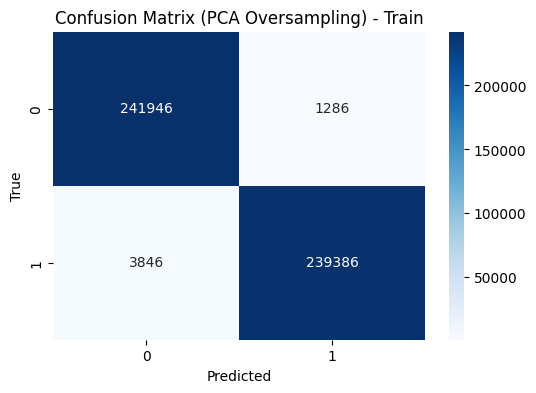

f1_test (PCA Oversampling): 0.6009
Balanced Accuracy (PCA Oversampling): 0.5233


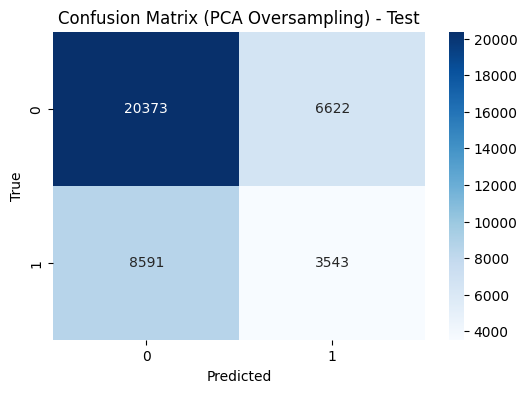

Code executed in 354.8393 seconds


In [11]:
# PCA OVERSAMPLED

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier(n_jobs=-1)

random_search_pca_over = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5, n_jobs=-1)
random_search_pca_over.fit(X_res_pca, y_res_pca)

# Store the best parameters
best_params_pca_over = random_search_pca_over.best_params_
print("Best Parameters (PCA Oversampling):", best_params_pca_over)

#Comment code above if you want to run using best params below
"""
#Best Param (obtained from running last time)
best_params_pca_over = {'n_estimators': 200,
'min_samples_split': 5,
'min_samples_leaf': 1,
'max_depth': None
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_pca_over)
rf_model.fit(X_res_pca, y_res_pca)

# Predict on the training set
y_pred_train = rf_model.predict(X_res_pca)

f1_train = f1_score(y_res_pca, y_pred_train, average='weighted', labels=np.unique(y_res_pca))
balanced_accuracy_train = balanced_accuracy_score(y_res_pca, y_pred_train)

conf_matrix_train = confusion_matrix(y_res_pca, y_pred_train)

print(f'f1_train (PCA Oversampling): {f1_train:.4f}')
print(f'Balanced Accuracy (PCA Oversampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Oversampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test_pca)

f1_test = f1_score(y_test_pca, y_pred_test, average='weighted', labels=np.unique(y_res_pca))
balanced_accuracy_test = balanced_accuracy_score(y_test_pca, y_pred_test)

conf_matrix_test = confusion_matrix(y_test_pca, y_pred_test)

print(f'f1_test (PCA Oversampling): {f1_test:.4f}')
print(f'Balanced Accuracy (PCA Oversampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4))  
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Oversampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
pca_oversample_balanced_accuracy = balanced_accuracy_test
pca_oversample_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


f1_train (PCA Undersampling): 0.6006
Balanced Accuracy (PCA Undersampling): 0.6027


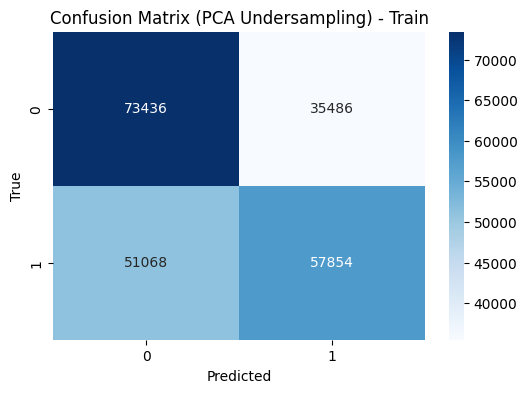

f1_test (PCA Undersampling): 0.6104
Balanced Accuracy (PCA Undersampling): 0.5694


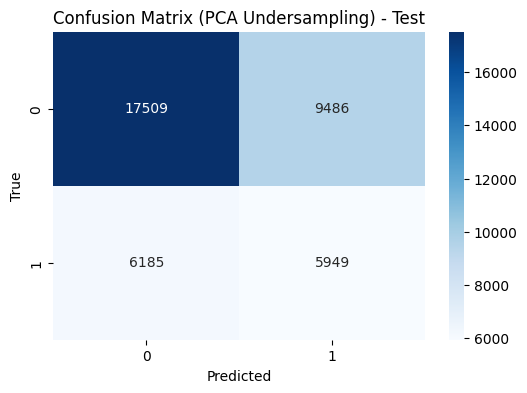

Code executed in 48.7711 seconds


In [12]:
# PCA UNDERSAMPLED

# Record start time
start_time = time.time()

# RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_model = RandomForestClassifier()

random_search_pca_under = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=5, n_jobs=-1)
random_search_pca_under.fit(X_under_pca, y_under_pca)

# Store the best parameters
best_params_pca_under = random_search_pca_under.best_params_
print("Best Parameters (PCA Undersampling):", best_params_pca_under)

#Comment code above if you want to run using best params below
"""
#Best Param (obtained from running last time)
best_params_pca_under = {'n_estimators': 200,
'min_samples_split': 5,
'min_samples_leaf': 1,
'max_depth': 10
}
"""

# Train the model with the best parameters
rf_model = RandomForestClassifier(**best_params_pca_under)
rf_model.fit(X_under_pca, y_under_pca)

# Predict on the training set
y_pred_train = rf_model.predict(X_under_pca)

f1_train = f1_score(y_under_pca, y_pred_train, average='weighted', labels=np.unique(y_under_pca))
balanced_accuracy_train = balanced_accuracy_score(y_under_pca, y_pred_train)

conf_matrix_train = confusion_matrix(y_under_pca, y_pred_train)

print(f'f1_train (PCA Undersampling): {f1_train:.4f}')
print(f'Balanced Accuracy (PCA Undersampling): {balanced_accuracy_train:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_train, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Undersampling) - Train")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Predict on the test set
y_pred_test = rf_model.predict(X_test_pca)

f1_test = f1_score(y_test_pca, y_pred_test, average='weighted', labels=np.unique(y_under_pca))
balanced_accuracy_test = balanced_accuracy_score(y_test_pca, y_pred_test)

conf_matrix_test = confusion_matrix(y_test_pca, y_pred_test)

print(f'f1_test (PCA Undersampling): {f1_test:.4f}')
print(f'Balanced Accuracy (PCA Undersampling): {balanced_accuracy_test:.4f}')

plt.figure(figsize=(6, 4)) 
sns.heatmap(conf_matrix_test, annot=True, cmap="Blues", fmt="d")
plt.title("Confusion Matrix (PCA Undersampling) - Test")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Store results
pca_undersample_balanced_accuracy = balanced_accuracy_test
pca_undersample_f1_score = f1_test

# Record end time
end_time = time.time()
duration = end_time - start_time
print(f"Code executed in {duration:.4f} seconds")


In [13]:
# NOTE: This code shows feature importance for your LAST RF code ran. For example if you ran PCA Regular just before, then it will output importances for PCA Regular!

# Feature importance (get the names first)
importances = rf_model.feature_importances_
print("Feature importances", importances)
feature_names = X_test.columns.tolist()
print(feature_names)

Feature importances [0.08104757 0.02239997 0.43829412 0.00403487 0.00571339 0.00475237
 0.27667121 0.01110757 0.01088754 0.14509138]
['Age', 'Number of Children', 'Income', 'Divorced', 'Married', 'Widowed', 'Current', 'Former', 'Physics_Activity', 'Alcohol_Consumption', 'Diet_Habits', 'Sleep_Patterns', 'Employment_Status', 'FamHist_Depression', 'ChronicMedCondition']


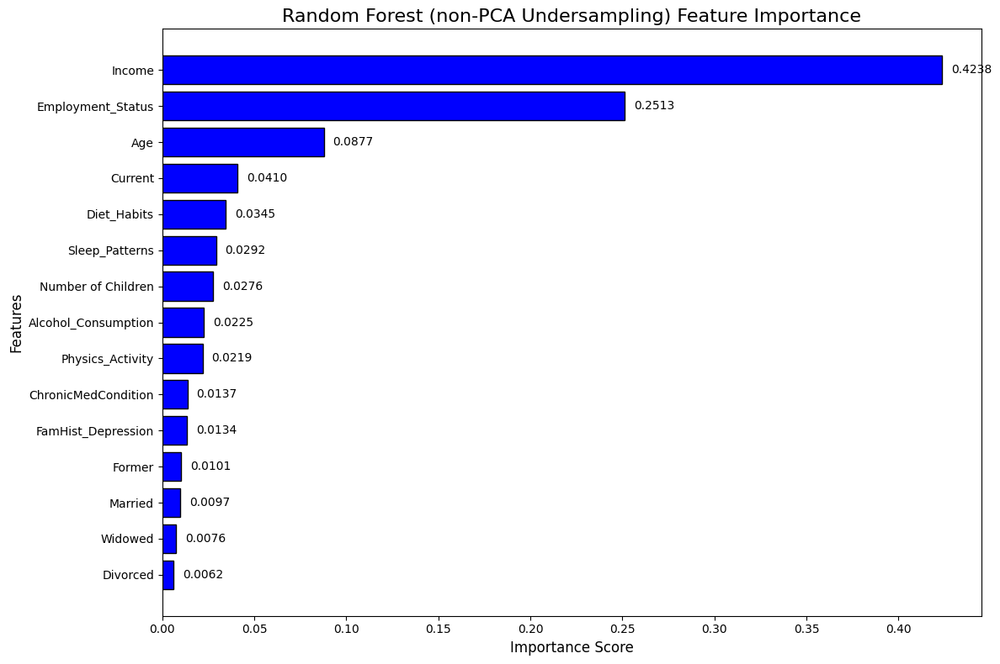

In [14]:
# Data Preparation (CHANGE IT ACCORDINGLY FROM WHAT YOU JUST GOT ON PREVIOUS CELL)
features = [
    'Age', 'Number of Children', 'Income', 'Divorced', 'Married', 'Widowed', 
    'Current', 'Former', 'Physics_Activity', 'Alcohol_Consumption', 
    'Diet_Habits', 'Sleep_Patterns', 'Employment_Status', 
    'FamHist_Depression', 'ChronicMedCondition'
]
importances = [
    0.08769928, 0.02758794, 0.42375178, 0.00616232, 0.00969643,
    0.0075866, 0.04095999, 0.01008514, 0.02186112, 0.02250338,
    0.03454491, 0.02916568, 0.25129373, 0.01343898, 0.01366271
]

# Create DataFrame
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

# Bar Plot
plt.figure(figsize=(12, 8))
bars = plt.barh(
    y=importance_df["Feature"], 
    width=importance_df["Importance"], 
    color="blue", 
    edgecolor="black"
)

# Add labels on the bars
for bar in bars:
    plt.text(
        bar.get_width() + 0.005, 
        bar.get_y() + bar.get_height() / 2,  
        f"{bar.get_width():.4f}",  
        va="center", 
        fontsize=10
    )

# Title and labels
plt.title("Random Forest (non-PCA Undersampling) Feature Importance", fontsize=16)
plt.xlabel("Importance Score", fontsize=12)
plt.ylabel("Features", fontsize=12)

# Order the bars from biggest to smallest (descending order)
plt.gca().invert_yaxis()

# Output
plt.tight_layout()
plt.show()


# **XGBOOST** # 

f1_score: 0.5644
0.5000091808817319


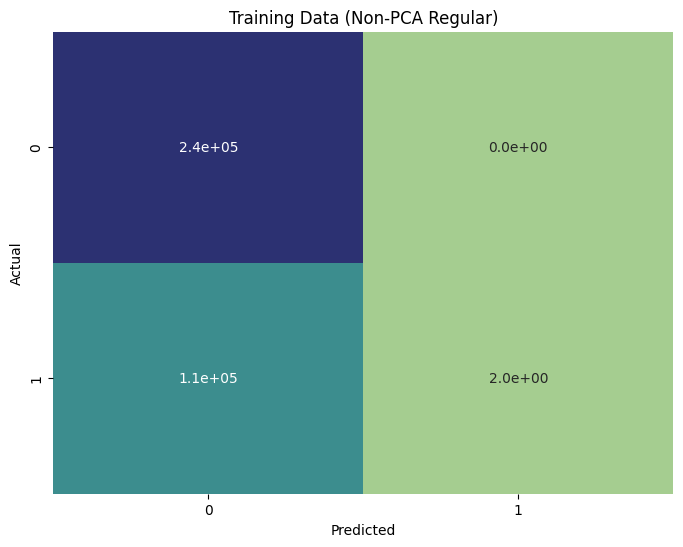

f1_score: 0.8165
0.5


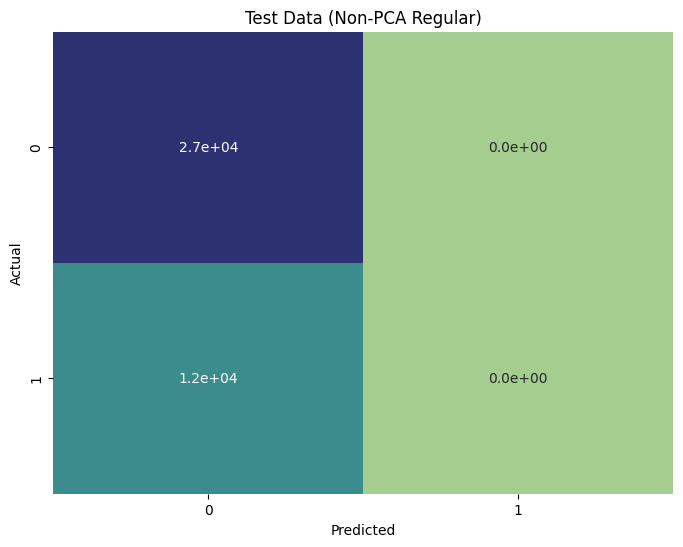

In [15]:
#Non-PCA Regular

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0]
}

model = xgb.XGBClassifier()
grid_search_basic = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_basic.fit(X_train, y_train)

print("Best parameters:", grid_search_basic.best_params_)

# Best Params (Obtained from running it last time!)
bestParamsRegularXG = {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}

# Training Evaluation
model = xgb.XGBClassifier(**bestParamsRegularXG)

model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)

f1_train = f1_score(np.float64(y_train), np.float64(y_pred_train), average='weighted', labels=np.unique(y_train))
print(f'f1_score: {f1_train:.4f}')
print(balanced_accuracy_score(y_train, y_pred_train))


# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_train, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (Non-PCA Regular)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()  

# Test Evaluation
y_pred_test = model.predict(X_test)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test), average='weighted', labels=np.unique(y_train))
print(f'f1_score: {f1_test:.4f}')
print(balanced_accuracy_score(y_test, y_pred_test))

# Confusion Matrix for Test Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (Non-PCA Regular)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()  



f1_score: 0.7097
0.7135553710038153


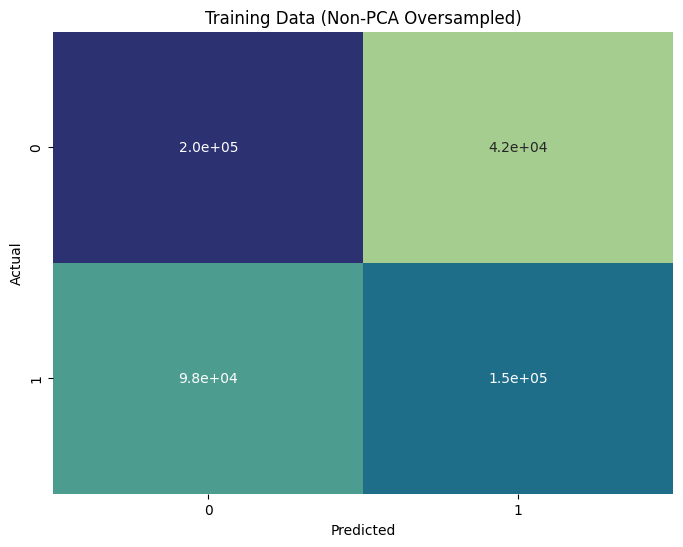

f1_score: 0.6461
0.5349241795321753


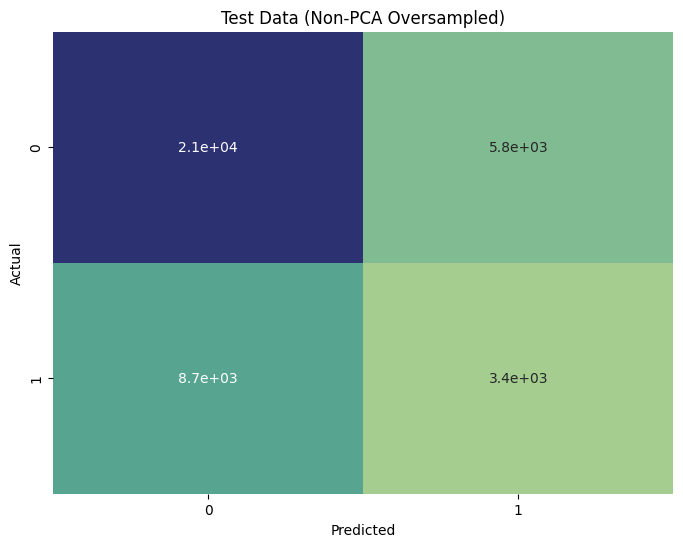

In [16]:
#Non-PCA Oversampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_basic = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_basic.fit(X_res, y_res)

print("Best parameters:", grid_search_basic.best_params_)

# Best Params (Obtained from running it last time!)
params_over = {'colsample_bytree': 0.7, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}

model = xgb.XGBClassifier(**params_over)
model.fit(X_res,y_res)

y_pred_train= model.predict(X_res)

f1_train = f1_score(np.float64(y_res), np.float64(y_pred_train), average='weighted', labels=np.unique(y_res))
print(f'f1_score: {f1_train:.4f}')
print(balanced_accuracy_score(y_res,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_res, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (Non-PCA Oversampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test= model.predict(X_test)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test), average='weighted', labels=np.unique(y_train))
print(f'f1_score: {f1_test:.4f}')
print(balanced_accuracy_score(y_test,y_pred_test))

# Confusion Matrix for Test Data
plt.figure(figsize=(8, 6))  # Create a new figure
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (Non-PCA Oversampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

f1_train: 0.5663
0.5730614568223132


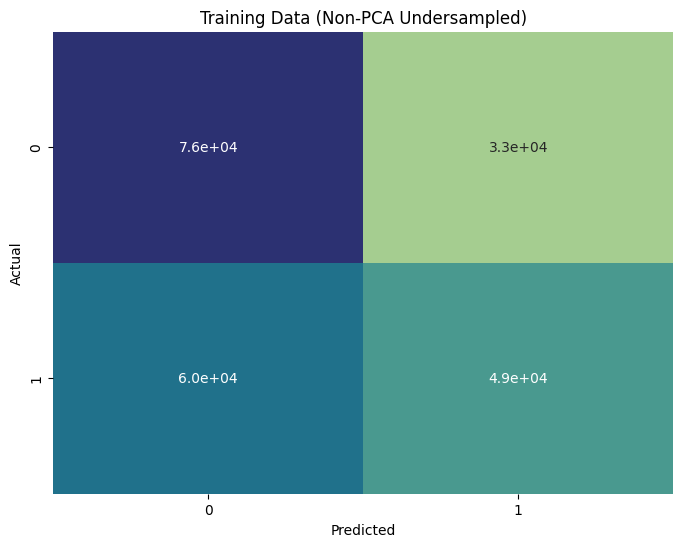

f1_test: 0.6136
0.5711807304083227


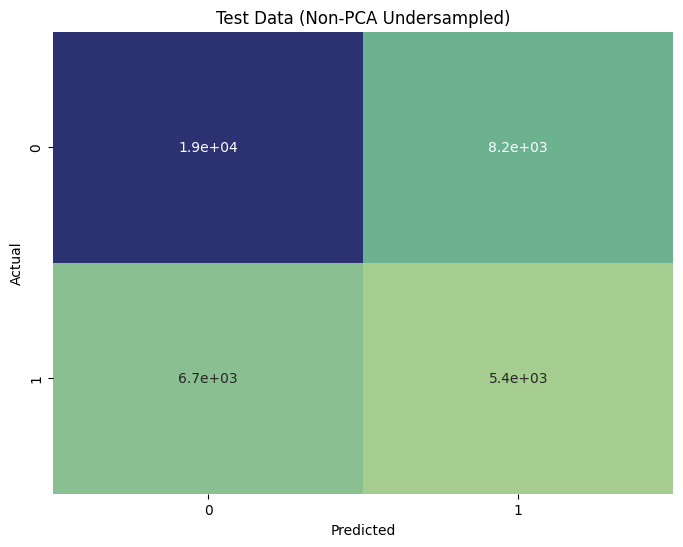

In [17]:
#Non-PCA Undersampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_basic = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_basic.fit(X_under, y_under)

print("Best parameters:", grid_search_basic.best_params_)

# Best Params (Obtained from running it last time!)
params_under = {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}

model = xgb.XGBClassifier(**params_under)
model.fit(X_under,y_under)

y_pred_train= model.predict(X_under)

f1_train = f1_score(np.float64(y_under), np.float64(y_pred_train), average='weighted', labels=np.unique(y_under))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_under,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_under, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (Non-PCA Undersampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


y_pred_test= model.predict(X_test)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test), average='weighted', labels=np.unique(y_train))
print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test,y_pred_test))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (Non-PCA Undersampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

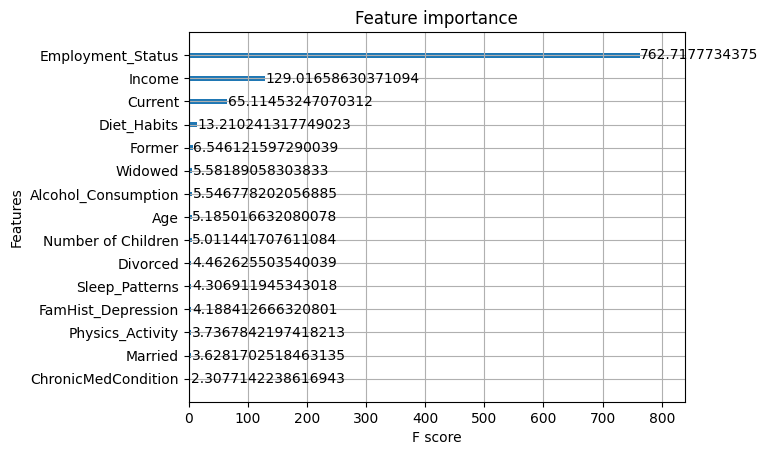

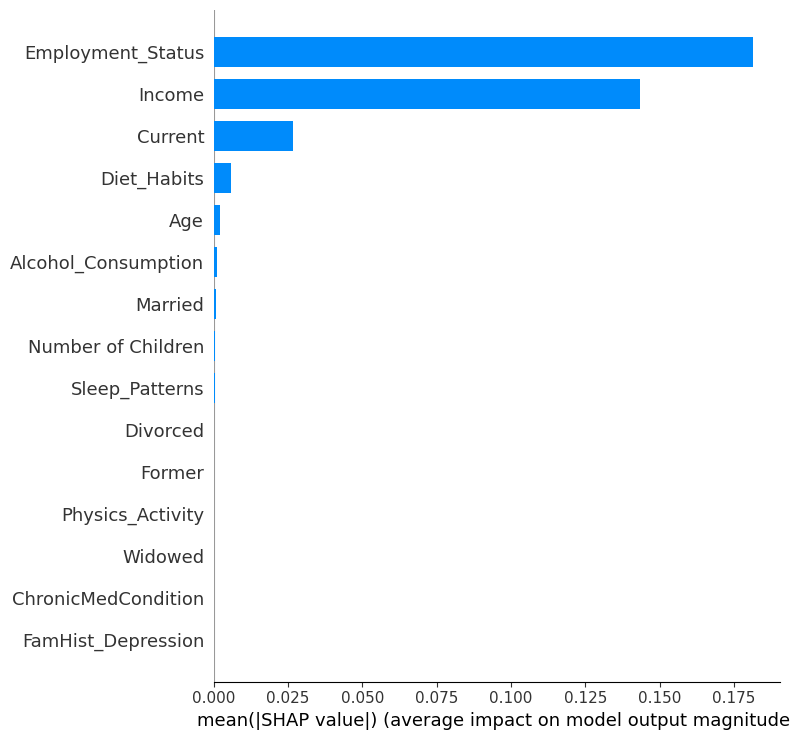

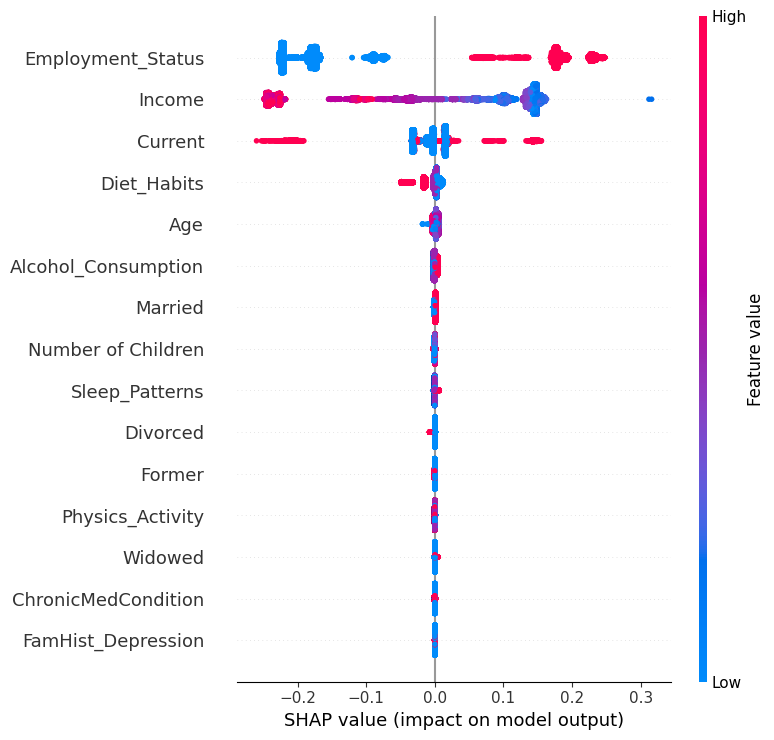

In [19]:
#SHAP and Feature Importance

import matplotlib.pyplot as plt
xgb.plot_importance(model, importance_type='gain')
plt.show()

# Assuming XGBoost model is already trained
# Initialize the SHAP explainer with the XGBoost model
explainer = shap.Explainer(model)

# Get SHAP values for the dataset
shap_values = explainer(X_test)  # X is the input data for prediction

# Summary plot of SHAP values
shap.summary_plot(shap_values, X_test, plot_type="bar")  # Bar plot for feature importance
shap.summary_plot(shap_values, X_test)  # Summary plot to show effect of each feature

# Optional: Visualize SHAP values for a single prediction
# shap.force_plot(explainer.expected_value, shap_values[0], X_under.iloc[0], matplotlib=True)


f1_train: 0.5940
0.594


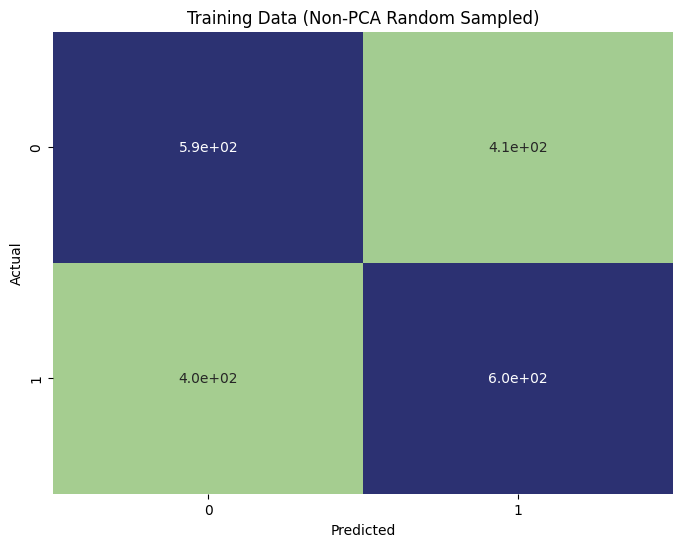

f1_test: 0.5492
0.5659712377677519


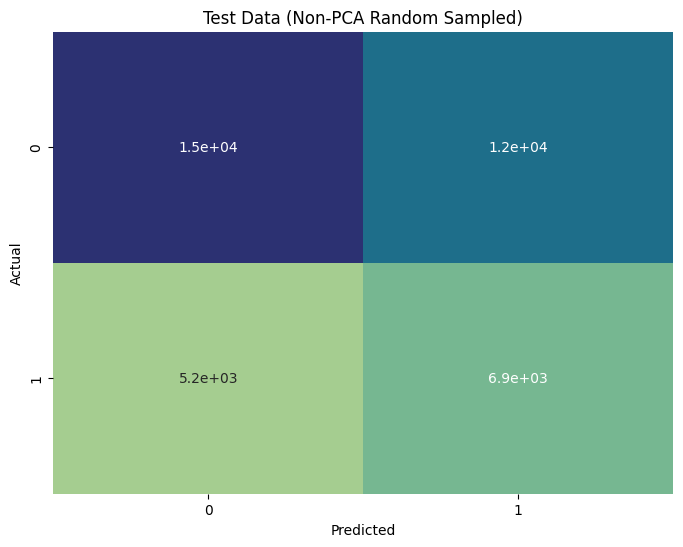

In [20]:
#Non-PCA Random Sampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
}

model = xgb.XGBClassifier()
grid_search_basic = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_basic.fit(X_train_rand, y_train_rand)

print("Best parameters:", grid_search_basic.best_params_)

# Best Params (Obtained from running it last time!)
params_rand = {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}

model = xgb.XGBClassifier(**params_rand)
model.fit(X_train_rand,y_train_rand)

y_pred_train= model.predict(X_train_rand)


f1_train = f1_score(np.float64(y_train_rand), np.float64(y_pred_train), average='weighted', labels=np.unique(y_train_rand))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_train_rand,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_train_rand, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (Non-PCA Random Sampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test = model.predict(X_test)


f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test), average='weighted', labels=np.unique(y_train))
print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test,y_pred_test))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (Non-PCA Random Sampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

f1_train: 0.5643
0.5


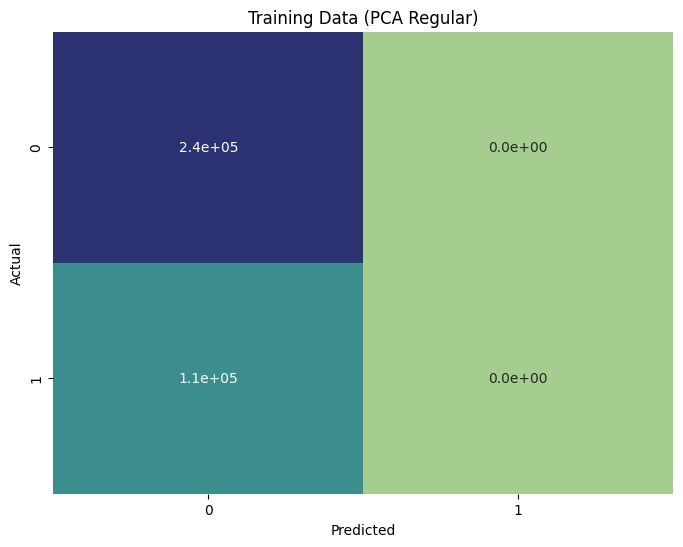

f1_test: 0.8165
0.5


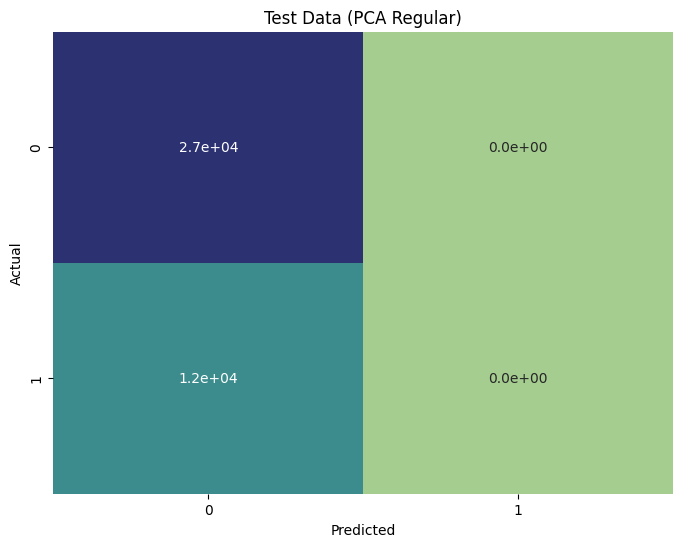

In [21]:
#PCA Regular

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_pca = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_pca.fit(X_train_pca, y_train_pca)

print("Best parameters:", grid_search_pca.best_params_)

# Best Params (Obtained from running it last time!)
grid_search_pca= {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}

model = xgb.XGBClassifier(**grid_search_pca)
model.fit(X_train_pca,y_train_pca)

y_pred_train= model.predict(X_train_pca)


f1_train = f1_score(np.float64(y_train_pca), np.float64(y_pred_train), average='weighted', labels=np.unique(y_train_pca))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_train_pca,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_train_pca, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (PCA Regular)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test = model.predict(X_test_pca)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test_pca), average='weighted', labels=np.unique(y_train))
print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test_pca,y_pred_test))

# Confusion Matrix for Test Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test_pca, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (PCA Regular)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

f1_train: 0.7332
0.7372796342586502


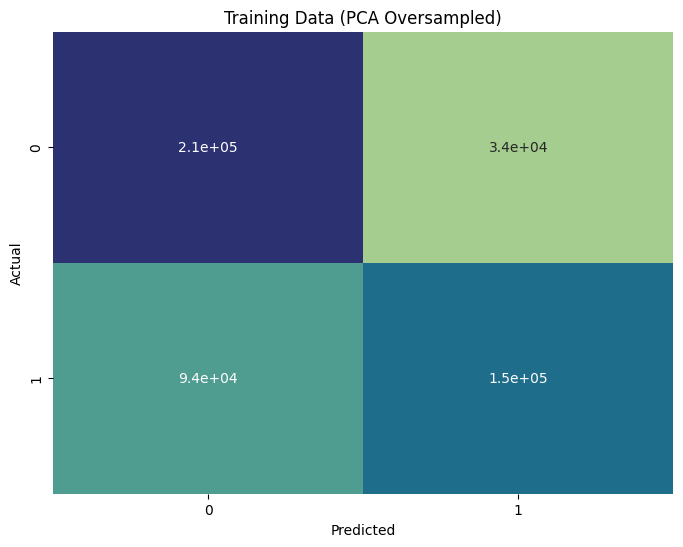

f1_test: 0.6135
0.5304048759952953


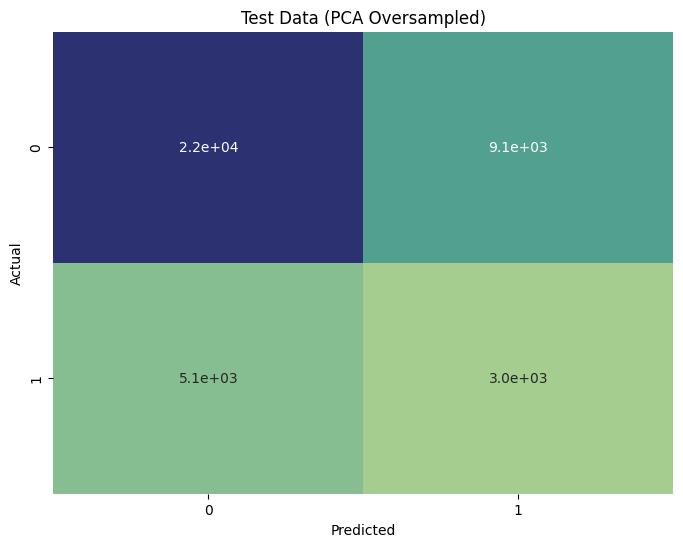

In [22]:
#PCA Oversampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_pca = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_pca.fit(X_res_pca, y_res_pca)

print("Best parameters:", grid_search_pca.best_params_)
pca_over_params = grid_search_pca.best_params_

# Best Params (Obtained from running it last time!)
pca_over_params =  {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}

model = xgb.XGBClassifier(**pca_over_params)
model.fit(X_res_pca,y_res_pca)

y_pred_train= model.predict(X_res_pca)


f1_train = f1_score(np.float64(y_res_pca), np.float64(y_pred_train), average='weighted', labels=np.unique(y_res_pca))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_res_pca,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_res_pca, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (PCA Oversampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test = model.predict(X_test_pca)

f1_test = f1_train = f1_score(np.float64(y_test_pca), np.float64(y_pred_test), average='weighted', labels=np.unique(y_res_pca))

print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test_pca,y_pred_test))

# Confusion Matrix for Test Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_pred_test, y_test_pca), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (PCA Oversampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

f1_train: 0.5734
0.5772479388920512


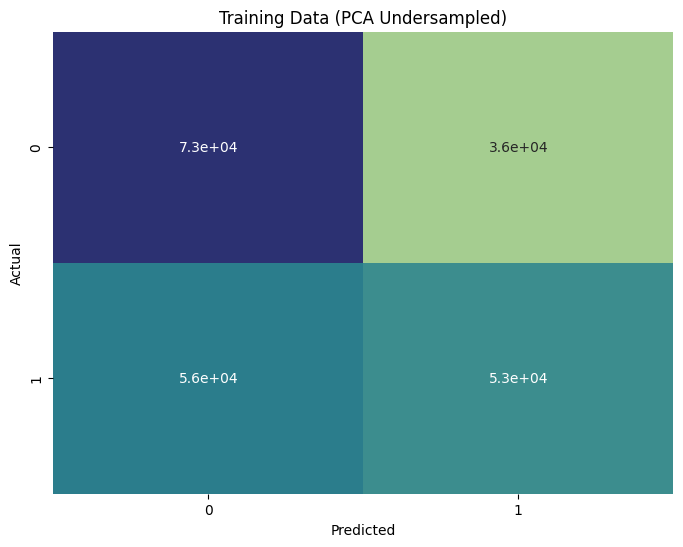

f1_test: 0.5995
0.5712832574987713


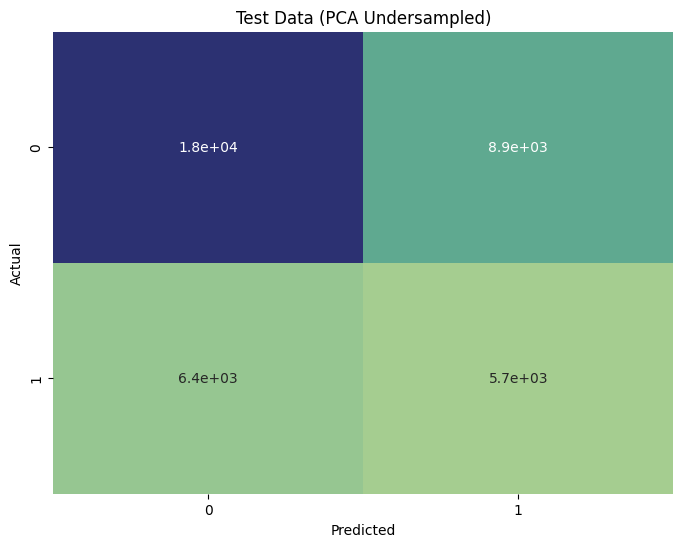

In [23]:
#PCA Undersampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_pca = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_pca.fit(X_under_pca, y_under_pca)

print("Best parameters:", grid_search_pca.best_params_)
pca_under_params = grid_search_pca.best_params_

# Best Params (Obtained from running it last time!)
pca_under_params= {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}


model = xgb.XGBClassifier(**pca_under_params)
model.fit(X_under_pca,y_under_pca)

y_pred_train= model.predict(X_under_pca)


f1_train = f1_score(np.float64(y_under_pca), np.float64(y_pred_train), average='weighted', labels=np.unique(y_under_pca))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_under_pca,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_under_pca, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (PCA Undersampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test = model.predict(X_test_pca)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test_pca), average='weighted', labels=np.unique(y_train))
print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test_pca,y_pred_test))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test_pca, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (PCA Undersampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

f1_train: 0.6742
0.6745


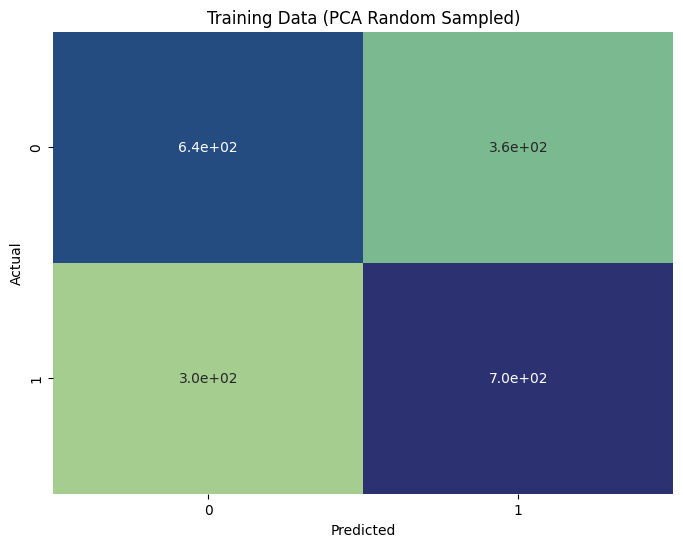

f1_test: 0.5237
0.5533066852755211


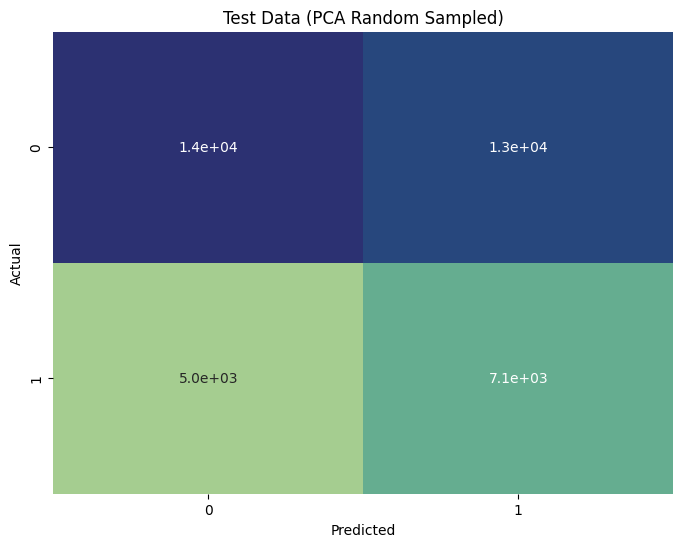

In [24]:
#PCA Random Sampling

from sklearn.model_selection import GridSearchCV
import xgboost as xgb

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'subsample': [0.7, 0.8, 1.0],
    }

model = xgb.XGBClassifier()
grid_search_pca = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search_pca.fit(X_train_rand_pca, y_train_rand_pca)

print("Best parameters:", grid_search_pca.best_params_)
pca_rand_params = grid_search_pca.best_params_

# Best Params (Obtained from running it last time!)
pca_rand_params =  {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}

model = xgb.XGBClassifier(**pca_rand_params)
model.fit(X_train_rand_pca,y_train_rand_pca)

y_pred_train= model.predict(X_train_rand_pca)


f1_train = f1_score(np.float64(y_train_rand_pca), np.float64(y_pred_train), average='weighted', labels=np.unique(y_train_rand_pca))
print(f'f1_train: {f1_train:.4f}')
print(balanced_accuracy_score(y_train_rand_pca,y_pred_train))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_train_rand_pca, y_pred_train), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Training Data (PCA Random Sampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

y_pred_test = model.predict(X_test_pca)

f1_test = f1_score(np.float64(y_pred_test), np.float64(y_test_pca), average='weighted', labels=np.unique(y_train))
print(f'f1_test: {f1_test:.4f}')
print(balanced_accuracy_score(y_test_pca,y_pred_test))

# Confusion Matrix for Training Data
plt.figure(figsize=(8, 6))  
sns.heatmap(confusion_matrix(y_test_pca, y_pred_test), annot=True, fmt=".1e", cmap="crest", cbar=False)
plt.title("Test Data (PCA Random Sampled)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()